<a href="https://colab.research.google.com/github/lynnkaram/ml-course-projects/blob/main/project-3-generative-models-and-graph-learning/generative_models_graph_learning_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Intermediate Machine Learning: Assignment 3

**Deadline**

Assignment 3 is due Thursday, October 30 by 11:59pm. Late work will not be accepted as per the course policies (see the Syllabus and Course policies on Canvas).

Directly sharing answers is not okay, but discussing problems with the course staff or with other students is encouraged. Acknowledge any use of an AI system such as ChatGPT or Copilot.


You should start early so that you have time to get help if you're stuck. The drop-in office hours schedule can be found on Canvas. You can also post questions or start discussions on Ed Discussion. The assignment may look long at first glance, but the problems are broken up into steps that should help you to make steady progress.

**Submission**

Submit your assignment as a pdf file on Gradescope, and as a notebook (.ipynb) on Canvas. You can access Gradescope through Canvas on the left-side of the class home page. The problems in each homework assignment are numbered. Note: When submitting on Gradescope, please select the correct pages of your pdf that correspond to each problem. This will allow graders to more easily find your complete solution to each problem.

To produce the .pdf, please convert to html and then print to pdf. (You may want to use your pdf print menu to scale the pages to be sure that cells are not truncated.) To convert to html, you can use this [converter notebook](https://colab.research.google.com/github/YData123/sds365-fa25/blob/main/assignments/Convert_ipynb_to_HTML_in_Colab.ipynb).

**Topics**

 * Variational autoencoders (VAEs)
 * Undirected graphs
 * The graphical lasso



**I acknowledge the use of ChatGPT and Claude Sonnet 4.5 as assistive tools for completing this assignment.**

## Problem 1: Face time (35 points)

In this problem, we will implement a "shoestring" version of [this amazing fake face generator](https://www.nytimes.com/interactive/2020/11/21/science/artificial-intelligence-fake-people-faces.html), using a variational autoencoder (VAE). Building a generator like the one featured in the article can take a tremendous amount of computational resources, time, and parameter tuning. In this problem we will build a basic version to illustrate the main concepts, and help you to become more famililar with VAEs.  Here is an outline of the process that we'll step you through:

### Problem outline:

* Load data
* Create face groups based on attributes
* Construct the VAE
* Define the loss function and train the VAE (Problem 1.1)
* Encode and reconstruct faces (Problem 1.2)
* Visualize the latent space (Problem 1.3)
* Morph between faces (Problem 1.4)
* Shift attributes of faces (Problem 1.5)
* Generate new faces (Problem 1.6)
* Analyze the effect of the scaling factor in the loss function (Problem 1.7, optional)

In the next cell we load the packages that we'll need. If you don't have one or more of these, you can install them with `!pip install <package_name>` in the cell, or outside the notebook
with `conda install -c conda-forge <package_name>`

In [ ]:
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import os
import glob
import pandas as pd
import random
import numpy as np
import imageio
from tqdm import tqdm
from PIL import Image
from sklearn.model_selection import train_test_split
from scipy.stats import norm
import tensorflow
# tensorflow.compat.v1.disable_eager_execution()

### Loading the data

[Labeled Faces in the Wild](http://vis-www.cs.umass.edu/lfw/) (LFW) is a database of face photographs. The images are placed in the folder lfw-deepfunneled. lfw_attributes.txt is a document including a set of attributes associated for each image, such as 'Male', 'Smile', 'Bold', etc. All the features are numerical and large positive values indicate that the keywords well describe the photo; large negative values indicate that the keywords don't fit the photo.

For this problem, we will keep only the middle parts of the photos to avoid complex backgrounds.

Download the data from the cloud at these URLs:

https://sds365.s3.amazonaws.com/lfw/lfw-deepfunneled.zip
<br>
https://sds365.s3.amazonaws.com/lfw/lfw_attributes.txt

Once you have the data, unzip it, and place it in a directory that we will call "YOUR_PATH" below.
  
Run all the cells in this section to load the data.

Note: Please write down the entire path instead of using something like '~/Desktop/datasets/' to avoid unnecessary compiling errors. Also, if you choose to use Colab to do your homework. We need to download the data into the same directory as your code. You may also need

"from google.colab import drive"

"drive.mount('/content/drive')"

to enable using paths in Google Drive before starting your code below. But personally, I would suggest using jupyter notebook to run the code locally instead of using Google Colab since the latter may take longer time.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Change these path names to correspond with your directory
DATASET_PATH = "/content/drive/MyDrive/lfw_data/lfw-deepfunneled/"
ATTRIBUTES_PATH = "/content/drive/MyDrive/lfw_data/lfw_attributes.txt"


In [ ]:
# Make sure the above path is correct before running this cell
dataset = []
for path in glob.iglob(os.path.join(DATASET_PATH, "**", "*.jpg")):
    person = path.split("/")[-2]
    dataset.append({"person":person, "path": path})

dataset = pd.DataFrame(dataset)
dataset = dataset.groupby("person").filter(lambda x: len(x) < 100 )
dataset.head(10)

,person,path
0,Jerome_Jenkins,/content/drive/MyDrive/lfw_data/lfw-deepfunnel...
1,Ernest_Hollings,/content/drive/MyDrive/lfw_data/lfw-deepfunnel...
2,Melana_Scantlin,/content/drive/MyDrive/lfw_data/lfw-deepfunnel...
3,Shaun_Rusling,/content/drive/MyDrive/lfw_data/lfw-deepfunnel...
4,Newton_Carlton_Slawson,/content/drive/MyDrive/lfw_data/lfw-deepfunnel...
5,Beatrice_Dalle,/content/drive/MyDrive/lfw_data/lfw-deepfunnel...
6,Stacey_Dales-Schuman,/content/drive/MyDrive/lfw_data/lfw-deepfunnel...
7,DAngelo_Jimenez,/content/drive/MyDrive/lfw_data/lfw-deepfunnel...
8,Steve_Karsay,/content/drive/MyDrive/lfw_data/lfw-deepfunnel...
9,Alejandro_Toledo,/content/drive/MyDrive/lfw_data/lfw-deepfunnel...


The following cell will display some sample images

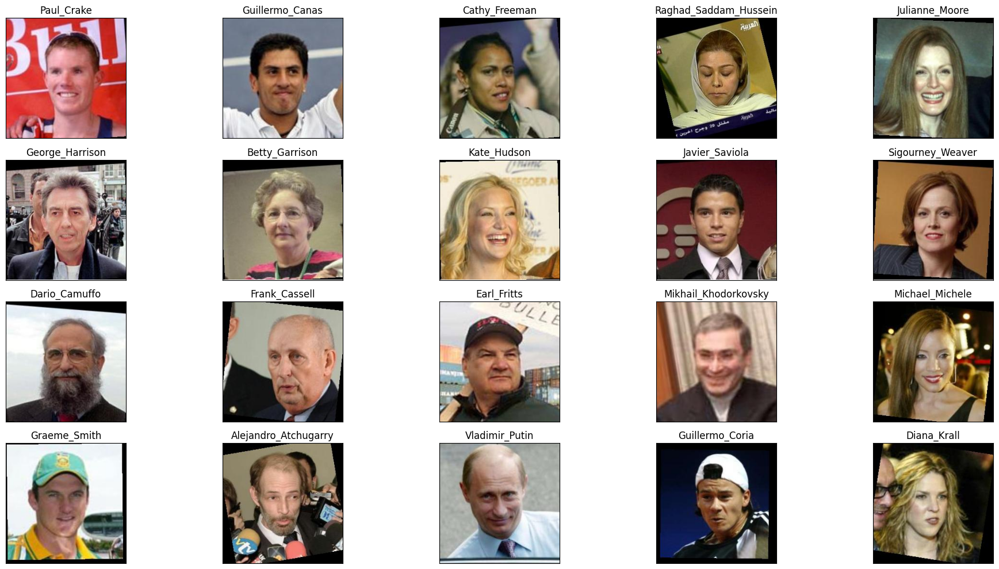

In [ ]:
sampled_id = []

plt.figure(figsize=(20,10))
for i in range(20):
    idx = random.randint(0, len(dataset))
    img = plt.imread(dataset.path.iloc[idx])
    plt.subplot(4, 5, i+1)
    plt.imshow(img)
    plt.title(dataset.person.iloc[idx])
    plt.xticks([])
    plt.yticks([])
    sampled_id.append(idx)
plt.tight_layout()
plt.show()

The following cell shows the images with some of the background removed.

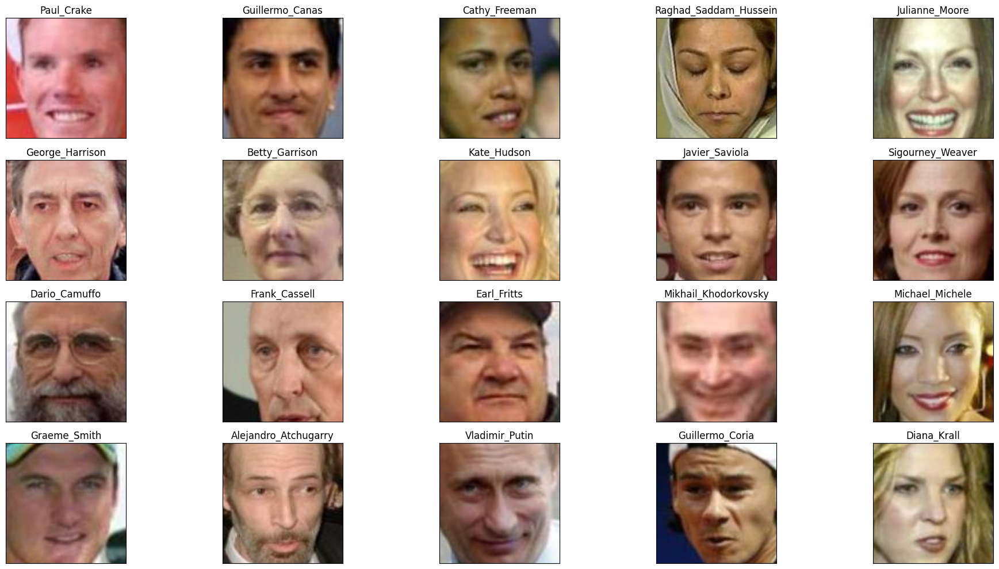

In [ ]:
dx=70
dy=70

plt.figure(figsize=(20,10))
for i in range(20):
    idx = sampled_id[i]
    img = plt.imread(dataset.path.iloc[idx])
    plt.subplot(4, 5, i+1)
    plt.imshow(img[dy:-dy,dx:-dx])
    plt.title(dataset.person.iloc[idx])
    plt.xticks([])
    plt.yticks([])
plt.tight_layout()
plt.show()

The following function crops the images to 45x45 pixels, which is what we will use in this problem.

In [ ]:
def fetch_dataset(dx=70, dy=70, dimx=45, dimy=45):

    df_attrs = pd.read_csv(ATTRIBUTES_PATH, sep='\t', skiprows=1,)
    df_attrs = pd.DataFrame(df_attrs.iloc[:,:-1].values, columns = df_attrs.columns[1:])

    photo_ids = []
    for dirpath, dirnames, filenames in os.walk(DATASET_PATH):
        for fname in filenames:
            if fname.endswith(".jpg"):
                fpath = os.path.join(dirpath,fname)
                photo_id = fname[:-4].replace('_',' ').split()
                person_id = ' '.join(photo_id[:-1])
                photo_number = int(photo_id[-1])
                photo_ids.append({'person':person_id,'imagenum':photo_number,'photo_path':fpath})

    photo_ids = pd.DataFrame(photo_ids)
    df = pd.merge(df_attrs,photo_ids,on=('person','imagenum'))

    assert len(df)==len(df_attrs),"lost some data when merging dataframes"

    all_photos = df['photo_path'].apply(imageio.imread)\
                                .apply(lambda img:img[dy:-dy,dx:-dx])\
                                .apply(lambda img: np.array(Image.fromarray(img).resize([dimx,dimy])) )

    all_photos = np.stack(all_photos.values).astype('uint8')
    all_attrs = df.drop(["photo_path","person","imagenum"],axis=1)

    return all_photos,all_attrs

The variable `data` has all the face images and the variable `attrs` has all the attributes. The 8-bit RGB values are converted to values between 0 and 1 for modeling and plotting purposes.

In [ ]:
print("DATASET_PATH =", DATASET_PATH)
print("ATTRIBUTES_PATH =", ATTRIBUTES_PATH)

DATASET_PATH = /content/drive/MyDrive/lfw_data/lfw-deepfunneled/
ATTRIBUTES_PATH = /content/drive/MyDrive/lfw_data/lfw_attributes.txt


In [ ]:
data, attrs = fetch_dataset()
data = np.array(data / 255, dtype='float32')

### Create Face Groups

We can now create groups of faces, by selecting the faces having the highest or lowest scores for each of the attributes. Run all the cells in this section to create and plot some face groups.

In [ ]:
def plot_gallery(images, h, w, n_row=3, n_col=6, with_title=False, titles=[]):
    plt.figure(figsize=(1.75 * n_col, 2 * n_row))
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        try:
            plt.imshow(images[i].reshape((h, w, 3)), cmap=plt.cm.gray, vmin=-1, vmax=1, interpolation='nearest')
            if with_title:
                plt.title(titles[i])
            plt.xticks(())
            plt.yticks(())
        except:
            pass

In [ ]:
IMAGE_H = data.shape[1]
IMAGE_W = data.shape[2]
N_CHANNELS = 3

In [ ]:
smile_ids = attrs['Smiling'].sort_values(ascending=False).head(36).index.values
smile_data = data[smile_ids]

no_smile_ids = attrs['Smiling'].sort_values(ascending=True).head(36).index.values
no_smile_data = data[no_smile_ids]

eyeglasses_ids = attrs['Eyeglasses'].sort_values(ascending=False).head(36).index.values
eyeglasses_data = data[eyeglasses_ids]

sunglasses_ids = attrs['Sunglasses'].sort_values(ascending=False).head(36).index.values
sunglasses_data = data[sunglasses_ids]

mustache_ids = attrs['Mustache'].sort_values(ascending=False).head(36).index.values
mustache_data = data[mustache_ids]

male_ids = attrs['Male'].sort_values(ascending=False).head(36).index.values
male_data = data[male_ids]

female_ids = attrs['Male'].sort_values(ascending=True).head(36).index.values
female_data = data[female_ids]

eyeclosed_ids = attrs['Eyes Open'].sort_values(ascending=True).head(36).index.values
eyeclosed_data = data[eyeclosed_ids]

mouthopen_ids = attrs['Mouth Wide Open'].sort_values(ascending=False).head(36).index.values
mouthopen_data = data[mouthopen_ids]

makeup_ids = attrs['Heavy Makeup'].sort_values(ascending=False).head(36).index.values
makeup_data = data[makeup_ids]

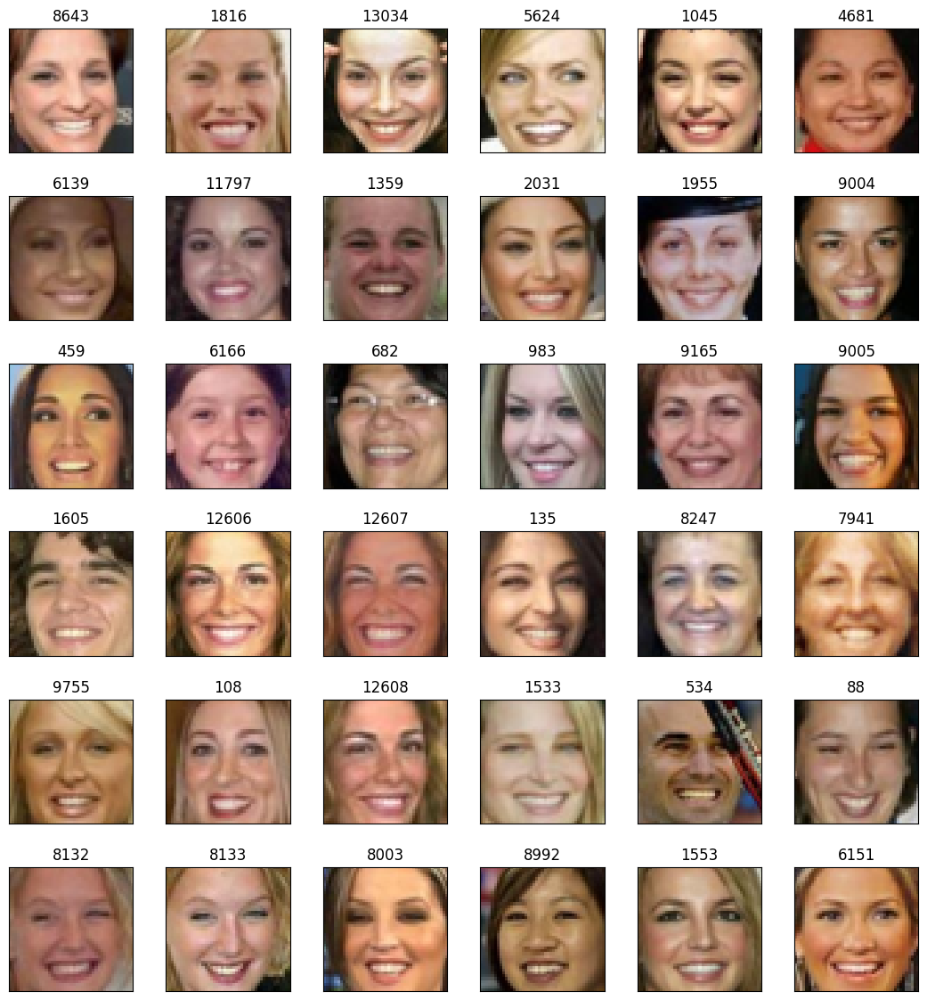

In [ ]:
plot_gallery(smile_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=smile_ids)

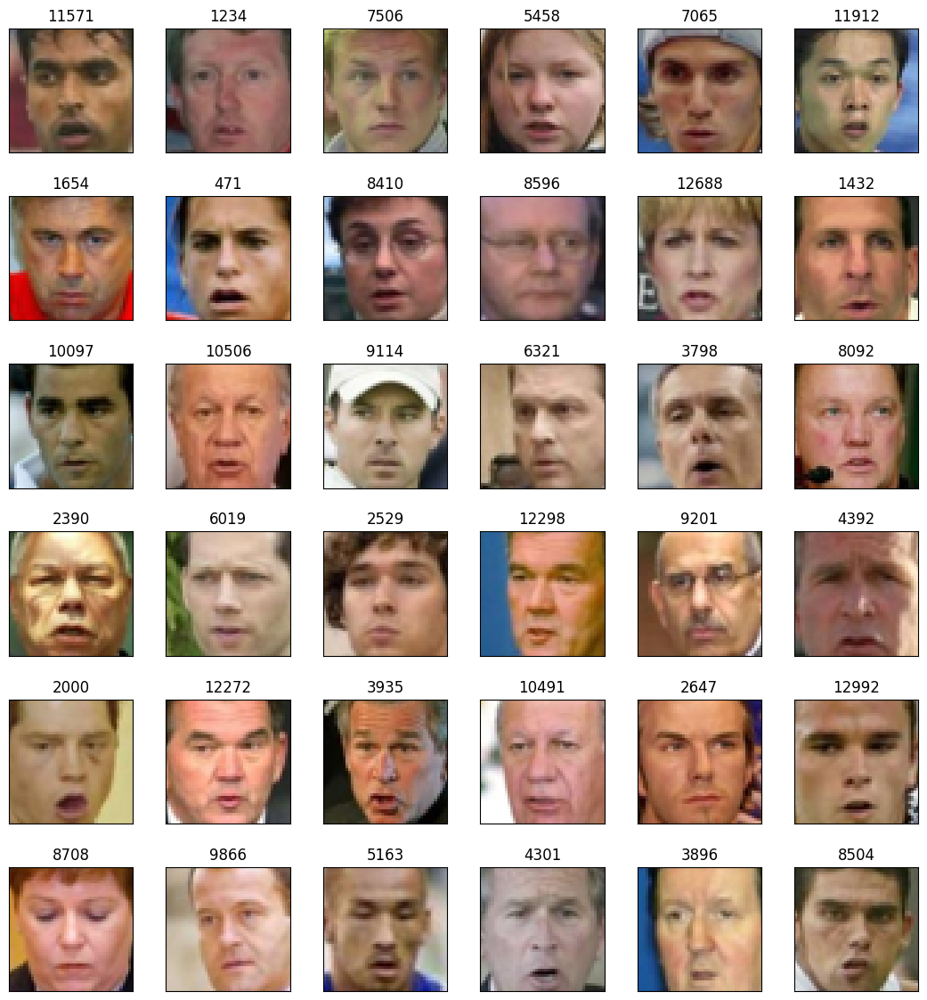

In [ ]:
plot_gallery(no_smile_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=no_smile_ids)

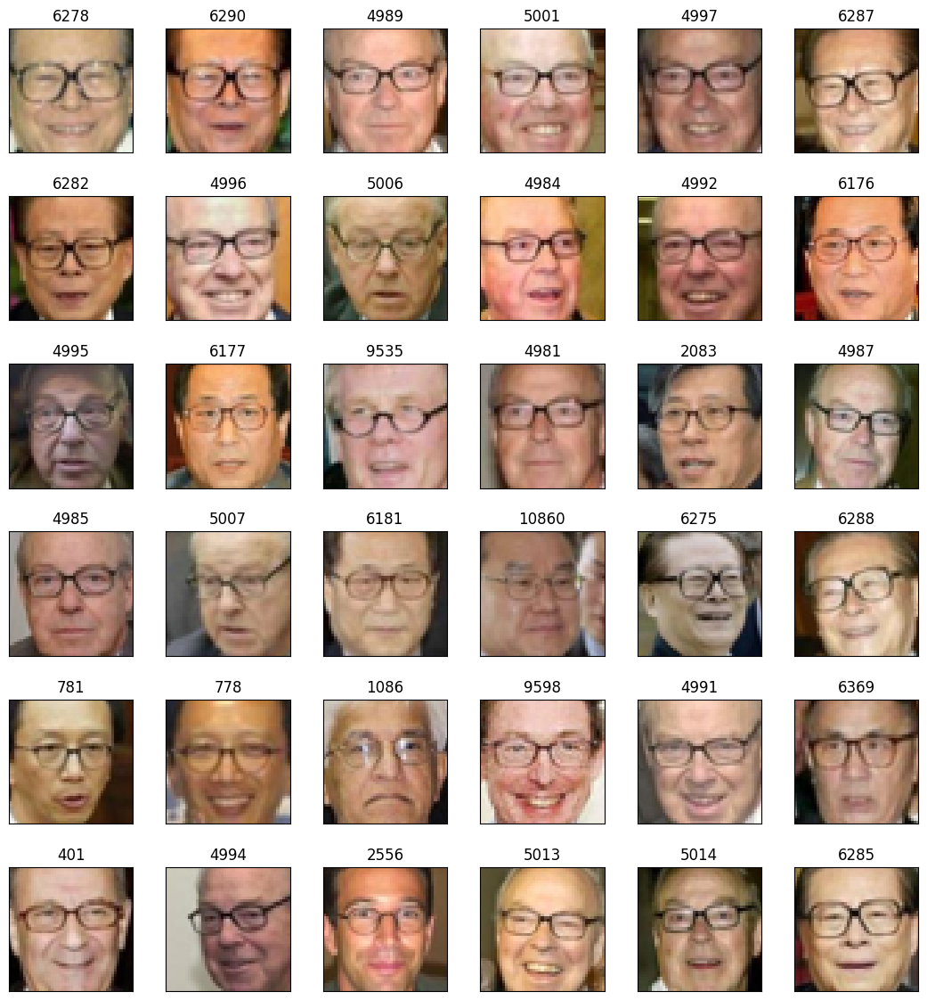

In [ ]:
plot_gallery(eyeglasses_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=eyeglasses_ids)

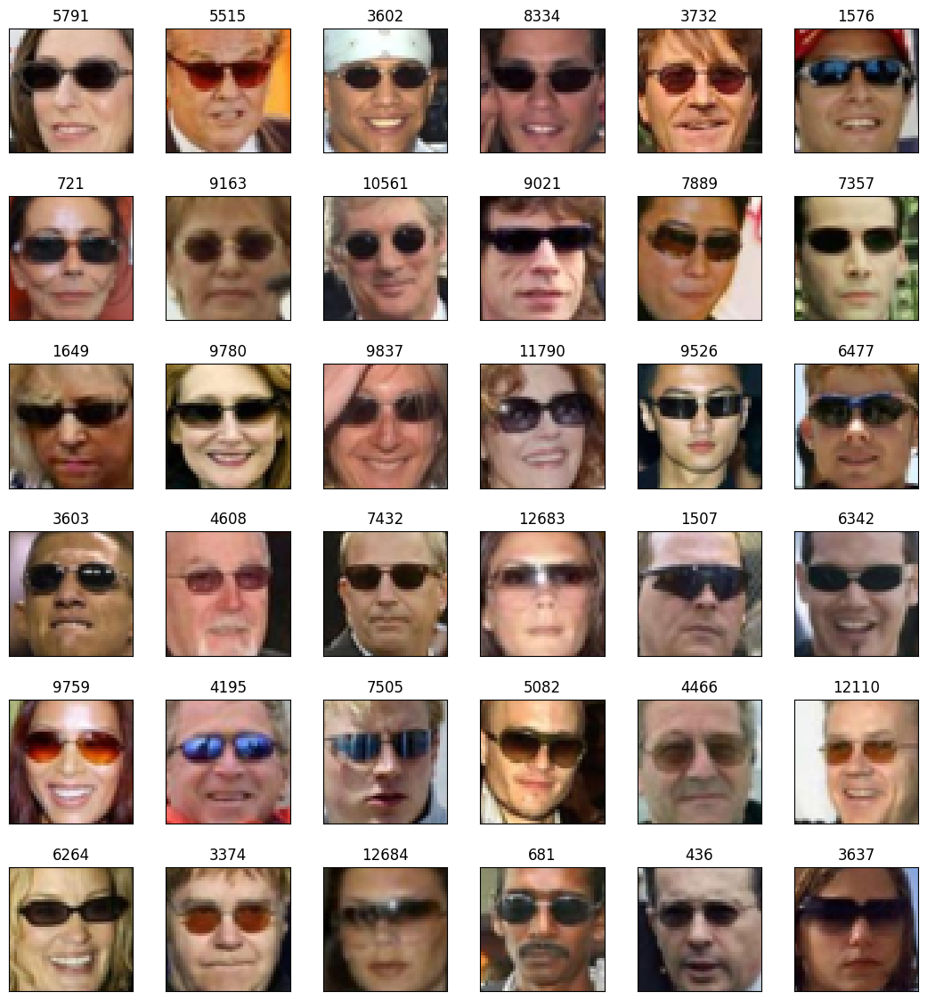

In [ ]:
plot_gallery(sunglasses_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=sunglasses_ids)

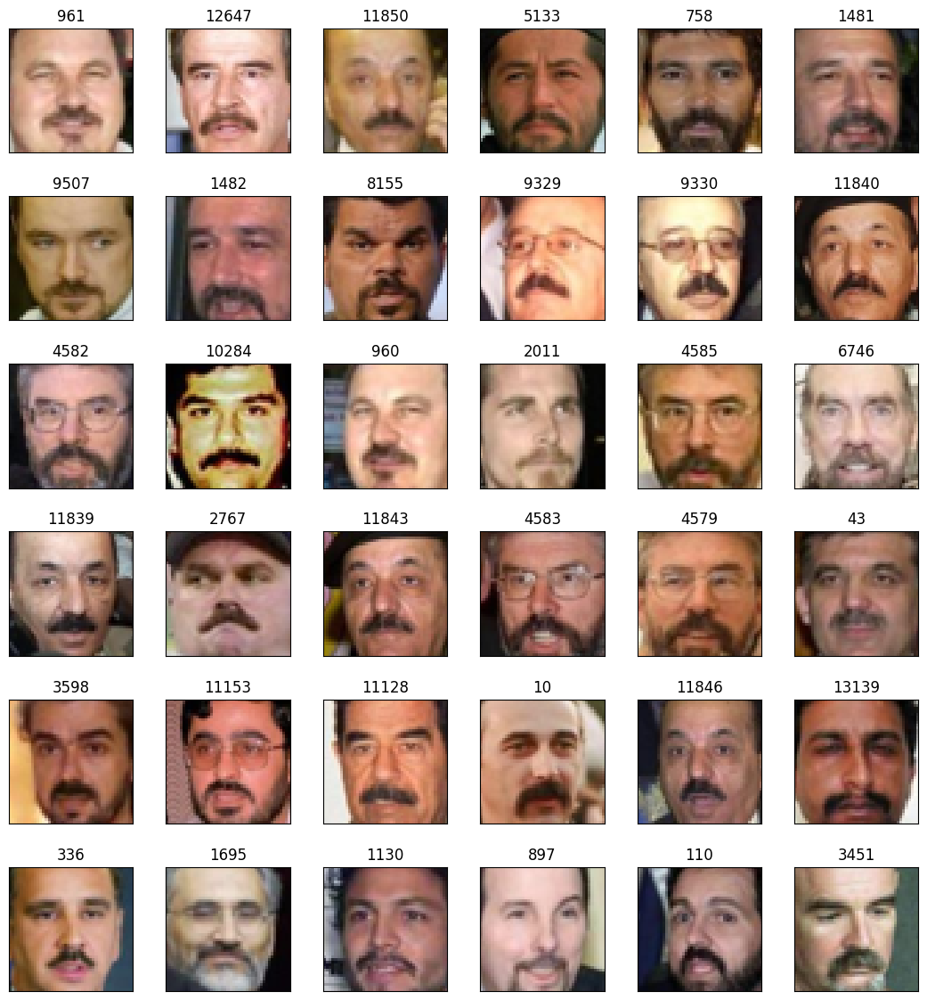

In [ ]:
plot_gallery(mustache_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=mustache_ids)

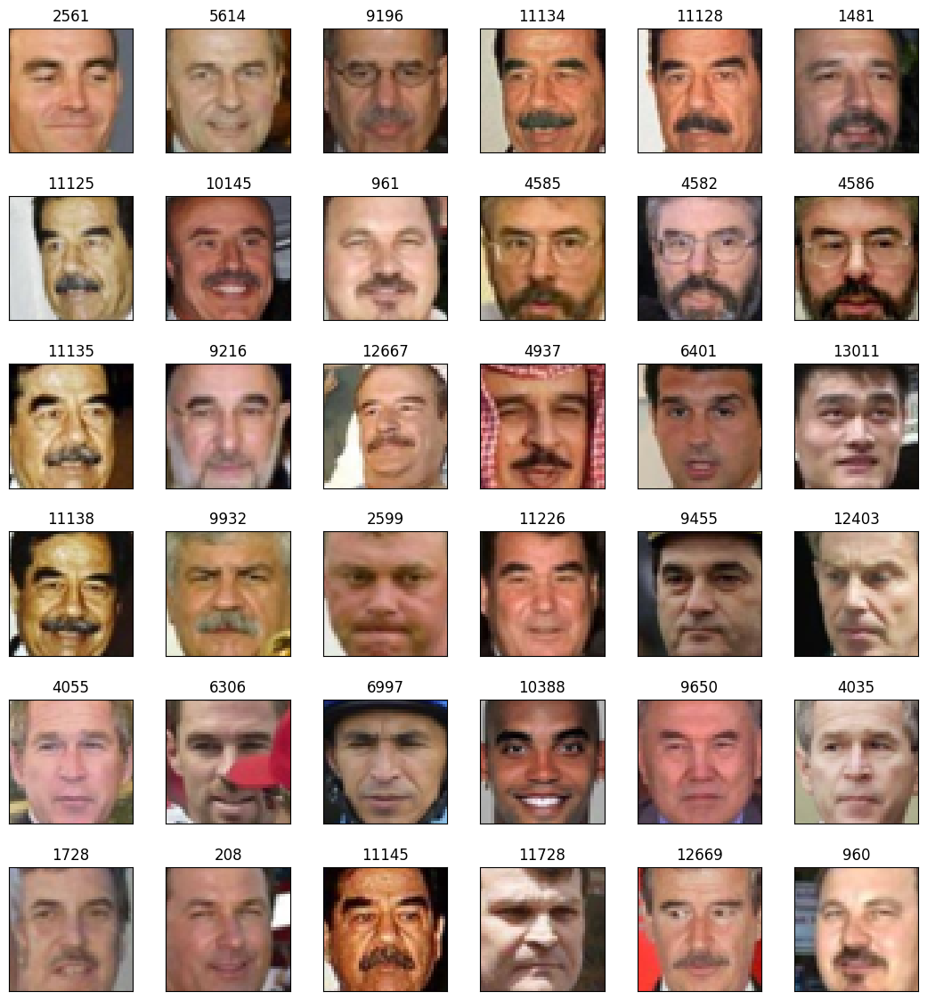

In [ ]:
plot_gallery(male_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=male_ids)

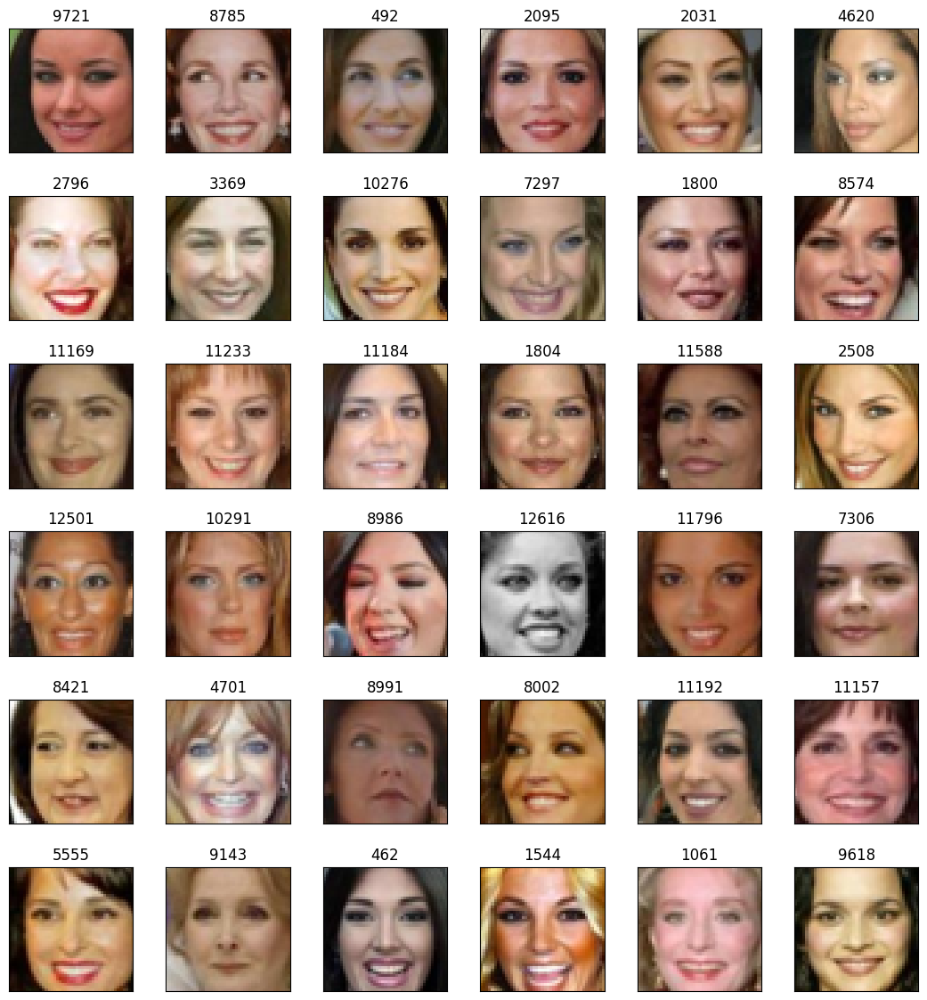

In [ ]:
plot_gallery(female_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=female_ids)

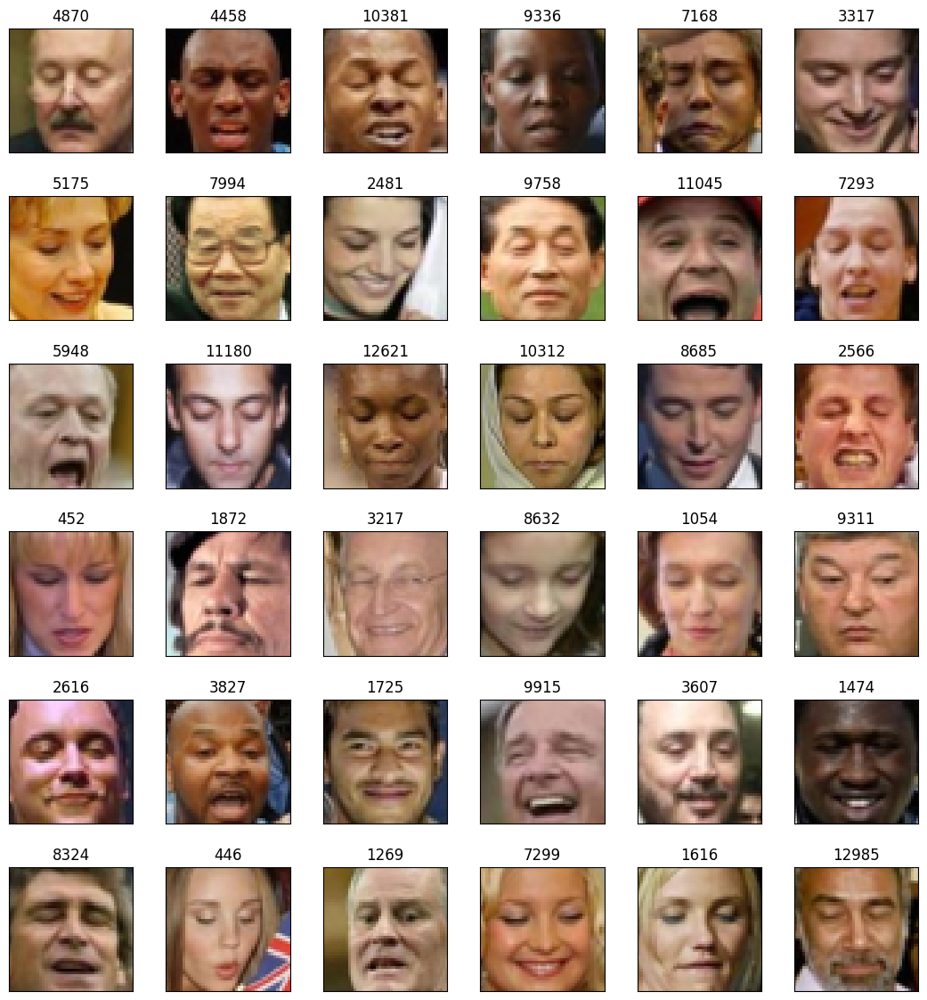

In [ ]:
plot_gallery(eyeclosed_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=eyeclosed_ids)

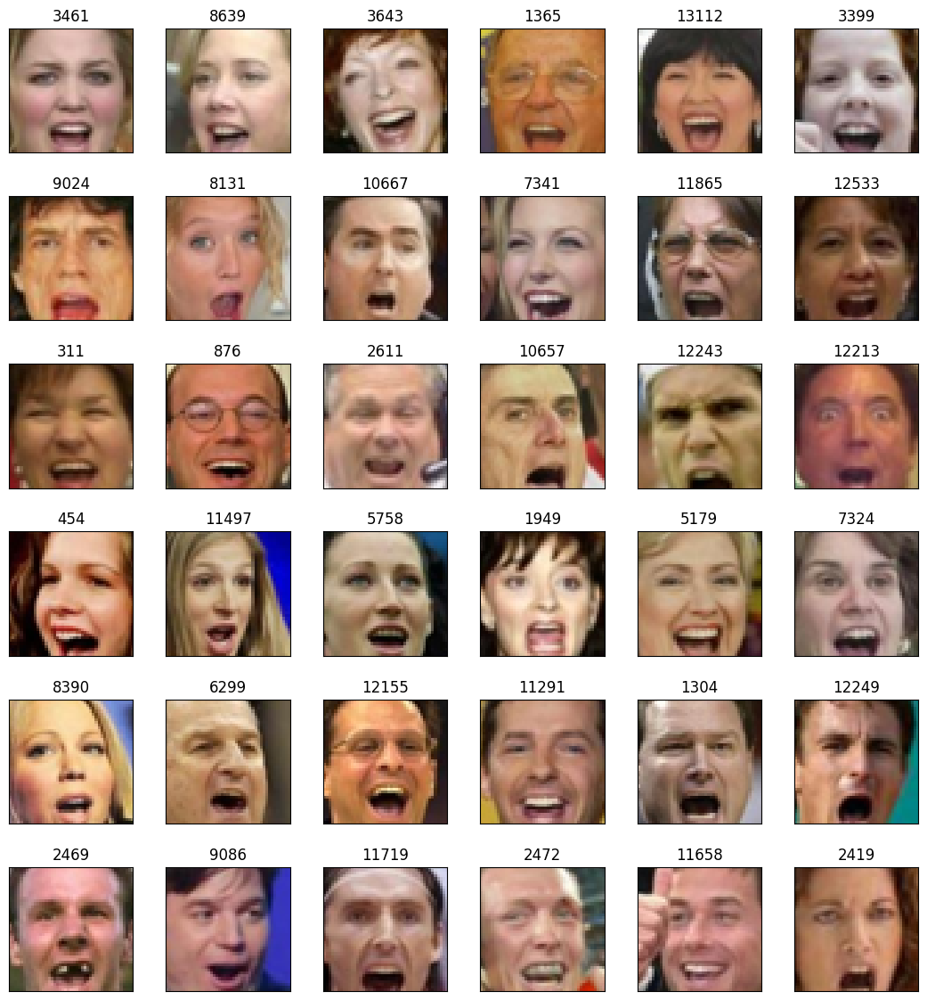

In [ ]:
plot_gallery(mouthopen_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=mouthopen_ids)

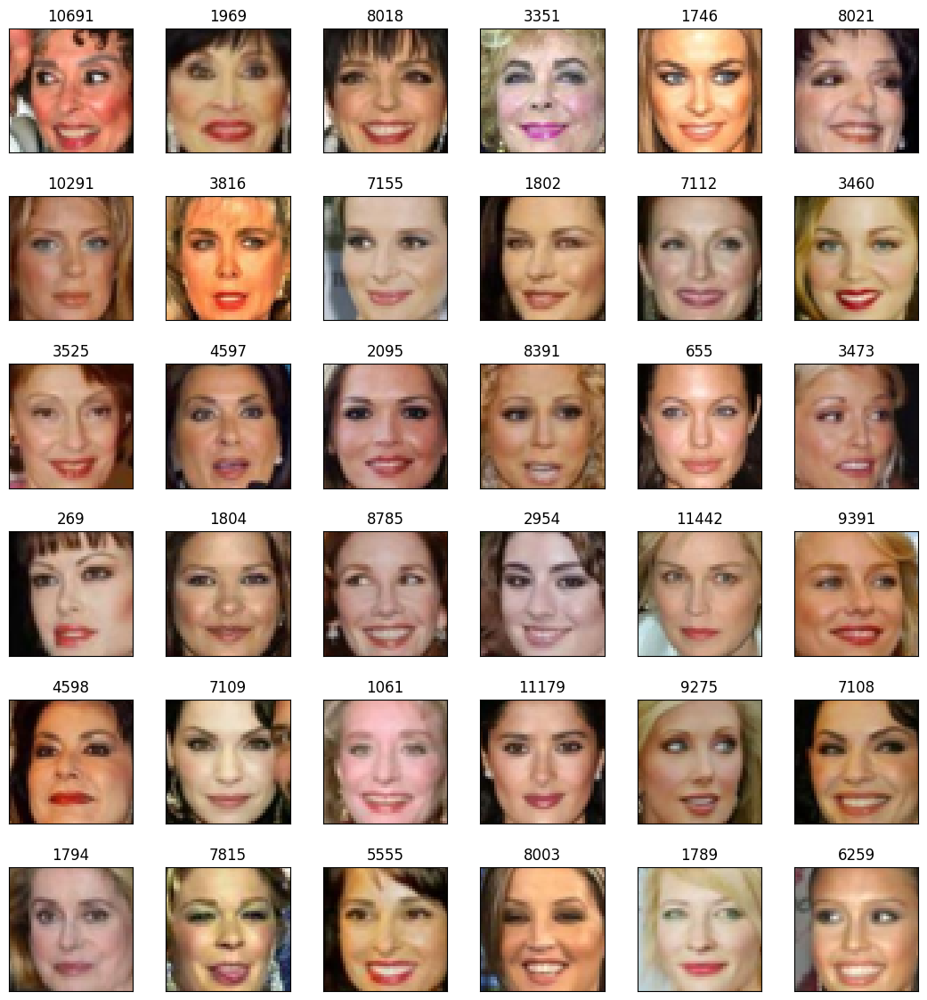

In [ ]:
plot_gallery(makeup_data, IMAGE_H, IMAGE_W, n_row=6, n_col=6, with_title=True, titles=makeup_ids)

### Constructing the encoder

Recall that the encoder part of the VAE architecture maps a data point to a variational mean and (log) variance. The mean is a point in the latent space.


In [ ]:
LATENT_SPACE_SIZE = 100

The "reparameterization trick" draws samples from the variational distribution that are parameterized by the variational mean and variance, so that the parameters of the encoder network can be trained.


In [ ]:
def sample_latent_features(distribution):
    distribution_mean, distribution_variance = distribution
    batch_size = tensorflow.shape(distribution_variance)[0]
    random = tensorflow.keras.backend.random_normal(shape=(batch_size, tensorflow.shape(distribution_variance)[1]))
    return distribution_mean + tensorflow.exp(0.5 * distribution_variance) * random

In [ ]:
input_data = tensorflow.keras.layers.Input(shape=(45, 45, 3))

encoder = tensorflow.keras.layers.Conv2D(64, (5,5), activation='relu')(input_data)
encoder = tensorflow.keras.layers.MaxPooling2D((2,2))(encoder)

encoder = tensorflow.keras.layers.Conv2D(64, (3,3), activation='relu')(encoder)
encoder = tensorflow.keras.layers.MaxPooling2D((2,2))(encoder)

encoder = tensorflow.keras.layers.Conv2D(32, (3,3), activation='relu')(encoder)
encoder = tensorflow.keras.layers.MaxPooling2D((2,2))(encoder)

encoder = tensorflow.keras.layers.Flatten()(encoder)

distribution_mean = tensorflow.keras.layers.Dense(LATENT_SPACE_SIZE, name='variational_mean')(encoder)
distribution_variance = tensorflow.keras.layers.Dense(LATENT_SPACE_SIZE, name='variational_log_variance')(encoder)
latent_encoding = tensorflow.keras.layers.Lambda(sample_latent_features)([distribution_mean, distribution_variance])

encoder_model = tensorflow.keras.Model(input_data, latent_encoding)
encoder_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 45, 45, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 41, 41,    │      4,864 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 20, 20,    │          0 │ conv2d[0][0]      │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 18, 18,    │     36,928 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 9, 9, 64)  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 7, 7, 32)  │     18,464 │ max_pooling2d_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 3, 3, 32)  │          0 │ conv2d_2[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 288)       │          0 │ max_pooling2d_2[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ variational_mean    │ (None, 100)       │     28,900 │ flatten[0][0]     │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ variational_log_va… │ (None, 100)       │     28,900 │ flatten[0][0]     │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lambda (Lambda)     │ (None, 100)       │          0 │ variational_mean… │
│                     │                   │            │ variational_log_… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 118,056 (461.16 KB)

 Trainable params: 118,056 (461.16 KB)

 Non-trainable params: 0 (0.00 B)

### Construct the decoder

The decoder network in the VAE architecture maps a latent vector to an image.
This is done with a series of transposed convolutional layers, since it must
map from low to high dimensions.


In [ ]:
decoder_input = tensorflow.keras.layers.Input(shape=(LATENT_SPACE_SIZE,))
decoder = tensorflow.keras.layers.Reshape((1, 1, 100))(decoder_input)
decoder = tensorflow.keras.layers.Conv2DTranspose(64, (3,3), activation='relu')(decoder)
decoder = tensorflow.keras.layers.UpSampling2D((2,2))(decoder)

decoder = tensorflow.keras.layers.Conv2DTranspose(32, (3,3), activation='relu')(decoder)
decoder = tensorflow.keras.layers.UpSampling2D((2,2))(decoder)

decoder = tensorflow.keras.layers.Conv2DTranspose(16, (5,5), activation='relu')(decoder)
decoder = tensorflow.keras.layers.UpSampling2D((2,2))(decoder)

decoder_output = tensorflow.keras.layers.Conv2DTranspose(3, (6,6), activation='relu')(decoder)

decoder_model = tensorflow.keras.Model(decoder_input, decoder_output)
decoder_model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 1, 1, 100)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 3, 3, 64)       │        57,664 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d (UpSampling2D)    │ (None, 6, 6, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 8, 8, 32)       │        18,464 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_1 (UpSampling2D)  │ (None, 16, 16, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 20, 20, 16)     │        12,816 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ up_sampling2d_2 (UpSampling2D)  │ (None, 40, 40, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 45, 45, 3)      │         1,731 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 90,675 (354.20 KB)

 Trainable params: 90,675 (354.20 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
encoded = encoder_model(input_data)
decoded = decoder_model(encoded)
autoencoder = tensorflow.keras.models.Model(input_data, decoded)

In [ ]:
def get_loss(distribution_mean, distribution_variance, factor, batch_size):

    def get_reconstruction_loss(y_true, y_pred, factor, batch_size):
        reconstruction_loss = tensorflow.math.squared_difference(y_true, y_pred)
        reconstruction_loss_batch = tensorflow.reduce_sum(reconstruction_loss)/batch_size
        return 0.5*reconstruction_loss_batch*factor

    def get_kl_loss(distribution_mean, distribution_variance, batch_size):
        kl_loss = LATENT_SPACE_SIZE + distribution_variance - tensorflow.square(distribution_mean) - tensorflow.exp(distribution_variance)
        kl_loss_batch = tensorflow.reduce_sum(kl_loss)/batch_size
        return kl_loss_batch*(-0.5)

    def total_loss(y_true, y_pred):
        reconstruction_loss_batch = get_reconstruction_loss(y_true, y_pred, factor, batch_size)
        kl_loss_batch = get_kl_loss(distribution_mean, distribution_variance, batch_size)
        return reconstruction_loss_batch + kl_loss_batch

    return total_loss

In [ ]:
from keras import ops, layers, Model
from keras.losses import mean_squared_error as mse

# --- KL layer ---
class KLLoss(layers.Layer):
    def call(self, inputs):
        mu, logvar = inputs
        # KL per sample: -0.5 * sum(1 + logvar - mu^2 - exp(logvar))
        kl_per_sample = -0.5 * ops.sum(1.0 + logvar - ops.square(mu) - ops.exp(logvar), axis=-1)
        self.add_loss(ops.mean(kl_per_sample))  # scalar KL
        return inputs  # pass-through

# 1) Create the KL node
kl_node = KLLoss(name="kl_loss")([distribution_mean, distribution_variance])

# 2) Tie the KL node into the forward graph but keep output = decoded
decoded = layers.Lambda(lambda xs: xs[0], name="with_kl")([decoded, kl_node])

# 3) (Re)build the model so the KL loss is included
autoencoder = tensorflow.keras.models.Model(input_data, decoded, name="autoencoder_with_kl")

# 4) reconstruction loss
def reconstruction_loss(y_true, y_pred, sum_over_channels=False):
    # per-pixel MSE (averaged over channels)
    per_pixel = mse(y_true, y_pred)                 # (B, H, W)
    H = ops.shape(per_pixel)[1]
    W = ops.shape(per_pixel)[2]
    factor = ops.cast(H * W, per_pixel.dtype)
    if sum_over_channels:
        C = ops.shape(y_true)[-1]                   # undo the channel mean
        factor = factor * ops.cast(C, per_pixel.dtype)
    return ops.mean(per_pixel) * factor             # mean over batch, sum over chosen dims

### 1.1 Deriving the loss function (5 points)

Derive the loss function defined in the cell above from the probability model perspective. You can ignore the scalar `factor` in your derivation. Show your work using either LaTeX or a picture of your written solution.

Hint: Think about how how the total loss is related to the ELBO.

**Please refer to the appendix attached at the end of the pdf**

The following three cells train the model. You can just run them. It may take a while to run on your laptop.

In [ ]:
X_train, X_val = train_test_split(data, test_size=0.2, random_state=365)

In [ ]:
batch_size = 64
# autoencoder.compile(loss=get_loss(distribution_mean, distribution_variance, factor = 100,
#                                   batch_size = batch_size), optimizer='adam')
autoencoder.compile(optimizer="adam", loss=reconstruction_loss)

autoencoder.summary()

Model: "autoencoder_with_kl"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 45, 45, 3) │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 41, 41,    │      4,864 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 20, 20,    │          0 │ conv2d[0][0]      │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 18, 18,    │     36,928 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 9, 9, 64)  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 7, 7, 32)  │     18,464 │ max_pooling2d_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 3, 3, 32)  │          0 │ conv2d_2[0][0]    │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 288)       │          0 │ max_pooling2d_2[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional          │ (None, 100)       │    118,056 │ input_layer[0][0] │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ variational_mean    │ (None, 100)       │     28,900 │ flatten[0][0]     │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ variational_log_va… │ (None, 100)       │     28,900 │ flatten[0][0]     │
│ (Dense)             │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_1        │ (None, 45, 45, 3) │     90,675 │ functional[0][0]  │
│ (Functional)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ kl_loss (KLLoss)    │ [(None, 100),     │          0 │ variational_mean… │
│                     │ (None, 100)]      │            │ variational_log_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ with_kl (Lambda)    │ (None, 45, 45, 3) │          0 │ functional_1[0][… │
│                     │                   │            │ kl_loss[0][0],    │
│                     │                   │            │ kl_loss[0][1]     │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 208,731 (815.36 KB)

 Trainable params: 208,731 (815.36 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
autoencoder.fit(X_train, X_train, epochs=50, batch_size=64, validation_data=(X_val, X_val))

Epoch 1/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 21s 66ms/step - loss: 168.9182 - val_loss: 69.1898
Epoch 2/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 67.2617 - val_loss: 59.7766
Epoch 3/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 58.8194 - val_loss: 55.4498
Epoch 4/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 55.3210 - val_loss: 53.2633
Epoch 5/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 51.5082 - val_loss: 50.2162
Epoch 6/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 49.8968 - val_loss: 48.5080
Epoch 7/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 48.4757 - val_loss: 48.6277
Epoch 8/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 47.4015 - val_loss: 46.3659
Epoch 9/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 46.7693 - val_loss: 46.0747
Epoch 10/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 45.9747 - val_loss: 44.9878
Epoch 11/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 45.8676 - val_loss: 44.8120
Epoch 12/50
165/1

In [ ]:
# Save your trained model (for later use)

# autoencoder.save("My_Trained_VAE")
# encoder_model.save("My_Trained_encoder")
# decoder_model.save("My_Trained_decoder")

If you experience issues while training the models above or if the process is taking too long, you may also use our pre-trained versions of the VAE, encoder, and decoder, which are available on Canvas.

No points will be taken off if you decide to use the pre-trained models, but we do recommend trying out the training process above. In case you encounter any issues when loading in the models, please post your questions on Ed discussion.

In [ ]:
# using the pre-trained models (credits/reference: student Levon Papikyan)
from tensorflow import keras
import tensorflow as tf
import numpy as np

# define the Lambda function called "sample_latent_features"
def sample_latent_features(args):
    mu, logvar = args
    eps = tf.random.normal(shape=tf.shape(mu))
    return mu + tf.exp(0.5 * logvar) * eps

# define the path where I saved Levon's models
MODEL_PATH = "/content/drive/MyDrive/assn3_pretrained_model"

encoder_model = keras.models.load_model(f"{MODEL_PATH}/Encoder.keras", compile=False, custom_objects={"sample_latent_features": sample_latent_features}, safe_mode=False)
decoder_model = keras.models.load_model(f"{MODEL_PATH}/Decoder.keras",compile=False)
autoencoder = keras.models.load_model(f"{MODEL_PATH}/Autoencoder.keras",compile=False, custom_objects={"sample_latent_features": sample_latent_features}, safe_mode=False)
print("Models loaded successfully") # just to make sure it worked

Models loaded successfully


### 1.2 Reconstructing faces (3 points)

The following cell encodes and reconstructs 16 random faces from the validation set with the trained VAE. Run the cell and comment on the reconstructed faces. (3 points)
* Do the reconstructed faces resemble the original images? How are they similar/different?
* Are there any faces that are reconstructed better or worse than the others? Can you think of why?
* Comment on any other aspects of your findings that are interesting to you.

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


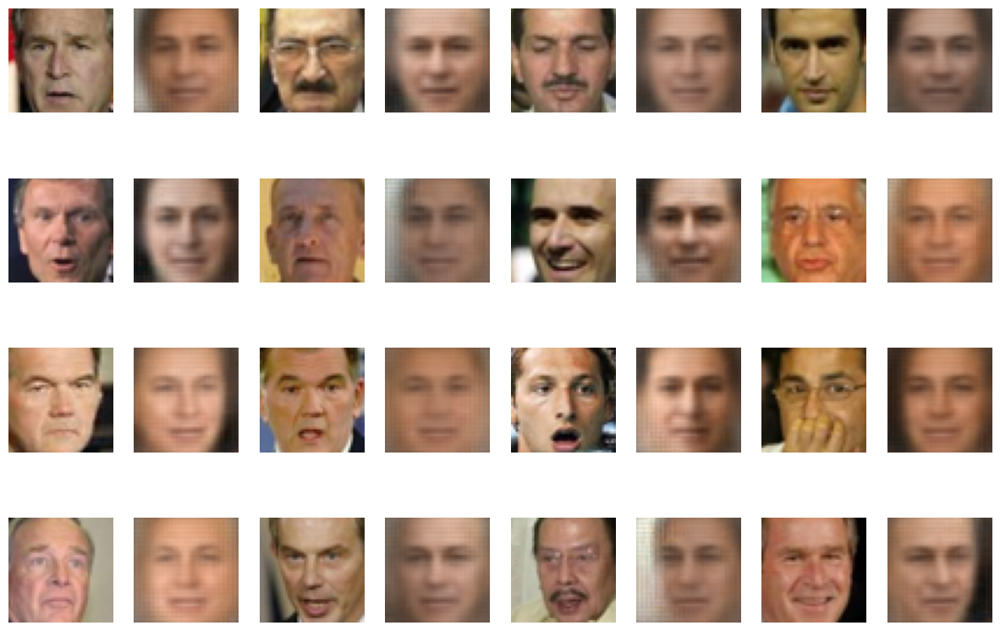

In [ ]:
sample_index = random.sample(range(1, len(X_val)), 16)

fig, axs = plt.subplots(4, 8)
fig.set_figheight(10)
fig.set_figwidth(15)

for i in range(4):
    for j in range(4):
        axs[i, 2*j].imshow(X_val[sample_index[4*i+j], :, :, :])
        axs[i, 2*j].axis('off')
        axs[i, 2*j+1].imshow(np.clip(autoencoder.predict(np.array([X_val[sample_index[4*i+j], :, :, :]]))[0],0,1))
        axs[i, 2*j+1].axis('off')

* **Do the reconstructed faces resemble the original images? How are they similar/different?**

The reconstructed faces partially resemble the original images. They capture their overall structure and pose, but with some differences. In terms of similarities, the reconstructions keep basic facial features like eye shape, nose shape, and general face orientation. The overall facial structure, head position, and skin tone are maintained reasonably well too.

However, there are several key differences. The reconstructions fail to capture fine details and variations: facial expressions such as smiles or open mouths (indicating shock or surprise) are not reconstructed accurately. Accessories like glasses are completely absent from the reconstructions, and distinctive features such as mustaches or hands covering the mouth are not reproduced either. The VAE appears to focus on reconstructing only the fundamental facial features (eyes, nose, mouth) while omitting individual characteristics.

Also, the reconstructed images exhibit a spatial quality pattern. They are blurrier and smoother around the edges, and clearer in the center of the image.

* **Are there any faces that are reconstructed better or worse than the others? Can you think of why?**

Yes, there is variation in reconstruction quality across the different faces. Faces with frontal poses, neutral expressions, and good lighting conditions tend to reconstruct better than others. This is because those "standard" faces are more common in the training data, allowing the VAE to learn their representations more effectively.

In contrast, faces with unusual characteristics reconstruct worse. For instance, faces captured at unusual angles, those displaying strong or extreme expressions (such as the face with the open mouth in row 3, column 5), or those with unusual lighting conditions show poorer reconstruction quality. These faces lose more of their distinctive features and appear more distorted or averaged compared to their originals.

A good example of this averaging effect can be seen with the 2nd, 3rd, and 4th faces in row 1, the 1st face in row 2, and the 3rd face in row 3. Despite being completely different individuals with distinct features in the original images, they are reconstructed in almost entirely the same way.

Overall, it seems like when the model encounters unusual poses, expressions, or lighting conditions (unsual because they are underrepresented during training), it struggles to encode them accurately in the latent space.

* **Comment on any other aspects of your findings that are interesting to you.**

The most interesting observation is that "averaging" effect throughout the reconstructions, where all faces tend to look somewhat similar despite originating from distinctly different individuals. This highlights how VAEs sacrifice identity-specific details in favor of maintaining general face structure. The model preserves the overall arrangement of facial features but loses the differences that make each person uniquely recognisable.

This averaging effect reveals a tradeoff between compression and reconstruction quality. By compressing high-dimensional face images into a low-dimensional latent space, the VAE must discard information and prioritise common patterns over individual characteristics. Additionally, the stochastic nature of the VAE introduces variability that pushes reconstructions toward more typical, averaged representations of faces rather than specific individuals.

### 1.3 Visualizing the latent space (10 points)

In `vae_demo` from class, the MNIST digits were generated from a two-dimensional latent space. In the current model, the latent space has more than two dimensions, so to visualize it we need to use a dimensionality reduction technique. (If you are not familiar with PCA, please refer to the material for Week 7 of [iML](https://ydata123.org/fa21/iml/calendar.html).)

In this problem, you will first implement the function `LatentSpace_2D`. (6 points)
1. Calculate the latent space encodings for two sets of faces that are different in one attribute, e.g. smile vs. no smile.
2. Use PCA to reduce the dimension of the latent space codes to two.
3. Visualize the latent space after dimensionality reduction with a scatter plot. Clearly color-code and label the two different groups.

Here is an example using smile_data and no_smile_data.
![Sample_1_3](https://raw.githubusercontent.com/YData123/sds365-sp22/main/assignments/assn3/Sample_1_3.png)

Visualize the latent space for at least three pairs of face groups including smile vs. no smile. Comment on how the scatter plots look.
* Are the two groups separable in the two-dimensional latent space? Is this what you expected? Why or why not? (2 points)
* How do the plots for the three different attributes differ from each other? (2 points)

In [ ]:
def LatentSpace_2D(encoder_model, data1, label1, data2, label2):
    """
    Visualise the latent space for two groups of faces in 2D
    Parameters:
    - encoder_model: trained encoder model
    - data1: first group of face images
    - label1: label for first group (string)
    - data2: second group of face images
    - label2: label for second group (string)
    """
    from sklearn.decomposition import PCA
    import matplotlib.pyplot as plt

    # Encode both datasets to get latent space representations
    # The encoder returns a single array of latent codes
    latent1 = encoder_model.predict(data1)
    latent2 = encoder_model.predict(data2)

    # Combine the latent encodings
    latent_combined = np.concatenate([latent1, latent2], axis=0)

    # Use PCA to reduce to 2 dimensions
    pca = PCA(n_components=2)
    latent_2d = pca.fit_transform(latent_combined)

    # Split back into two groups
    n1 = len(latent1)
    latent_2d_group1 = latent_2d[:n1]
    latent_2d_group2 = latent_2d[n1:]

    # Create scatter plot
    plt.figure(figsize=(8, 6))
    plt.scatter(latent_2d_group1[:, 0], latent_2d_group1[:, 1], alpha=0.6, label=label1, s=50)
    plt.scatter(latent_2d_group2[:, 0], latent_2d_group2[:, 1], alpha=0.6, label=label2, s=50)
    plt.xlabel('First Principal Component')
    plt.ylabel('Second Principal Component')
    plt.title(f'Latent Space Visualization: {label1} vs {label2}')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


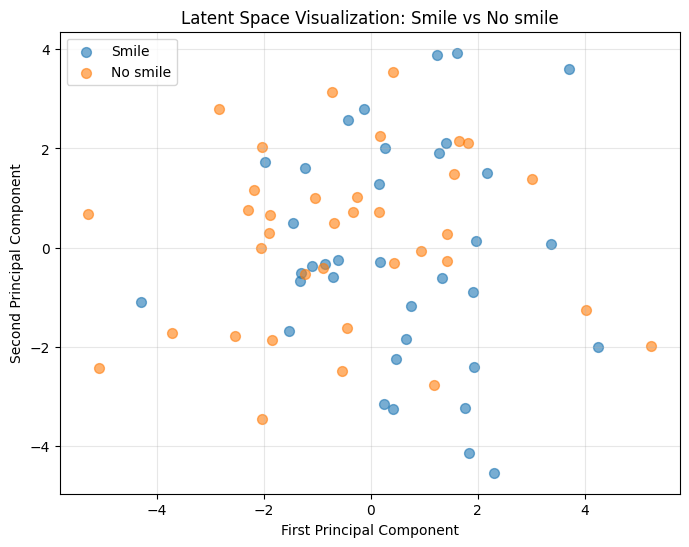

In [ ]:
LatentSpace_2D(encoder_model, smile_data, 'Smile', no_smile_data, 'No smile')

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


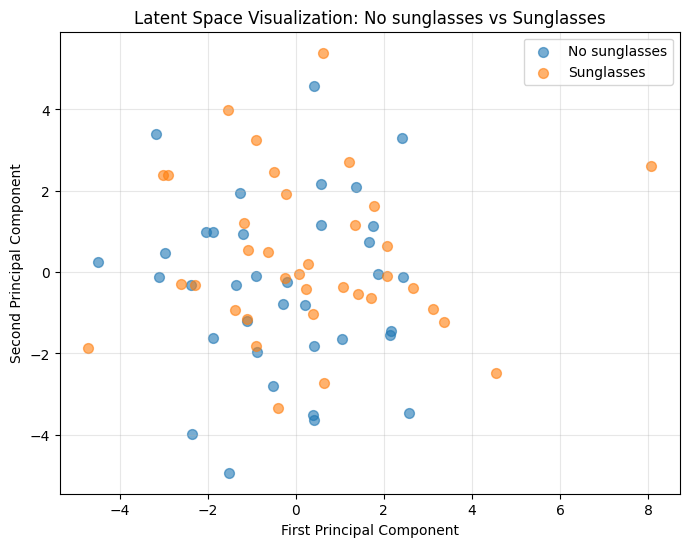

In [ ]:
LatentSpace_2D(encoder_model,smile_data,'No sunglasses',sunglasses_data,'Sunglasses')

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


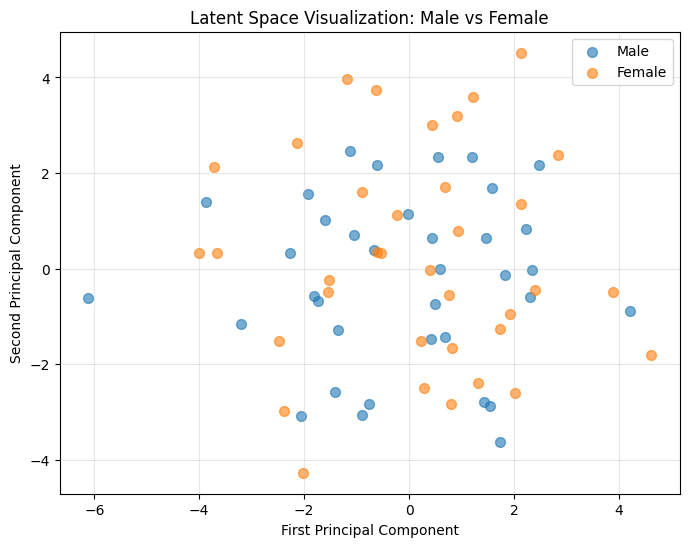

In [ ]:
LatentSpace_2D(encoder_model,male_data,'Male',female_data,'Female')

* **Are the two groups separable in the two-dimensional latent space? Is this what you expected? Why or why not? (2 points)**

The two groups are not clearly separable in any of the three visualisations. All show significant overlap between the classes in the 2D latent space. This can be expected for several reasons.

First, due to high-dimensional compression. The VAE compresses face images into a 100-dimensional latent space, which captures many facial features simultaneously (gender, age, expression, lighting, pose, etc.). When we further reduce this to 2D using PCA, we lose most of the information, making it harder to separate based on a single attribute.

Second is due to having multiple correlated features. Facial attributes are not independent. For example, the dataset might have correlations between gender and other features (e.g., facial hair, makeup), so the latent space organizes faces by multiple attributes at once, not just one.

Third is due to PCA limitation. PCA finds directions of maximum variance in the data, not necessarily the directions that best separate specific attributes.

* **How do the plots for the three different attributes differ from each other? (2 points)**

**Smile vs. no smile** The plot shows heavy overlap with both groups distributed throughout the space. The groups are almost completely intermixed. This suggests that "smiling" is a subtle feature that doesn't dominate the latent representation. This finding was slightly confusing given the example plot.

**No sunglasses vs. sunglasses** The plot still shows considerable overlap, but sunglasses wearers (orange) appear slightly more clustered in certain regions (particularly where both the first and second principal components are between -2 and 2). This suggests sunglasses create a somewhat more distinctive visual feature than smiling, though separation is still poor in 2D.

**Male vs. female** Shows the most mixing of all three comparisons, with both genders distributed across the entire space. This suggests gender information is captured in the latent space but is intertwined with many other features.

None of the attributes show clean separation in 2D, which indicates the latent space has learned a complex representation of facial features instead of organising faces by individual attributes. To properly separate these classes, we would need to examine more than just 2 principal components.

### 1.4 Morphing between faces (4 points)

Morph at least 5 pairs of faces with the function `morphBetweenImages` and comment on what you observe.
* Briefly explain how the morphing works. (2 points)
* Do the generated faces look like what you expected? Does any of the pairs work better than the others? If so, what kind of image pairs work better? (2 points)

In [ ]:
# Don't change the function
def morphBetweenImages(img1, img2, num_of_morphs):
    alpha = np.linspace(0,1,num_of_morphs)
    z1 = encoder_model.predict(np.array([img1]))
    z2 = encoder_model.predict(np.array([img2]))
    fig = plt.figure(figsize=(30,5))

    ax = fig.add_subplot(1, num_of_morphs+2, 1)
    ax.imshow(img1)
    ax.axis('off')
    ax.set_title(loc='center', label='original image 1',fontsize=10)

    for i in range(num_of_morphs):
        z = z1*(1-alpha[i]) + z2*alpha[i]
        new_img = decoder_model.predict(z)

        ax = fig.add_subplot(1, num_of_morphs+2, i+2)
        ax.imshow(np.clip(new_img.squeeze(),0,1))
        ax.axis('off')
        ax.set_title(loc='center', label='alpha={:.2f}'.format(alpha[i]))

    ax = fig.add_subplot(1, num_of_morphs+2, num_of_morphs+2)
    ax.imshow(img2)
    ax.axis('off')
    ax.set_title(loc='center', label='original image 2',fontsize=10)
    return

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


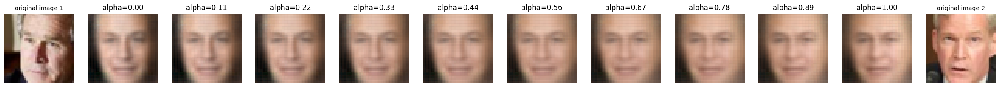

In [ ]:
# 1
sample_index = random.sample(range(1, len(data)), 2)
morphBetweenImages(data[sample_index[0]],data[sample_index[1]],10)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


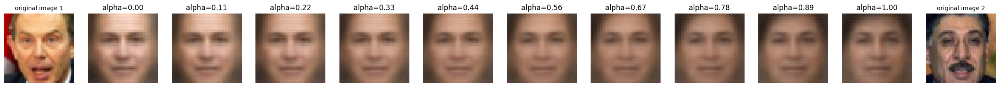

In [ ]:
# 2
sample_index = random.sample(range(1, len(data)), 2)
morphBetweenImages(data[sample_index[0]], data[sample_index[1]], 10)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step


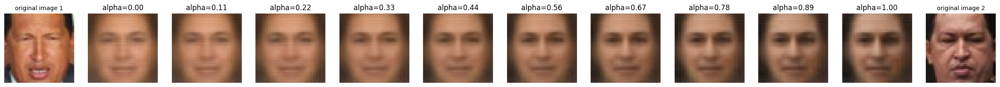

In [ ]:
# 3
sample_index = random.sample(range(1, len(data)), 2)
morphBetweenImages(data[sample_index[0]], data[sample_index[1]], 10)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


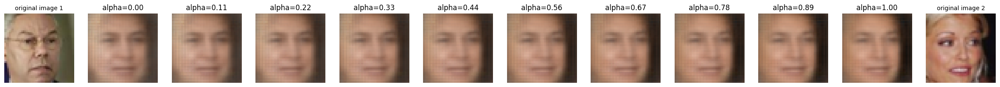

In [ ]:
# 4
sample_index = random.sample(range(1, len(data)), 2)
morphBetweenImages(data[sample_index[0]], data[sample_index[1]], 10)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


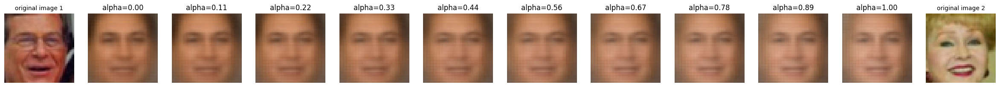

In [ ]:
# 5
sample_index = random.sample(range(1, len(data)), 2)
morphBetweenImages(data[sample_index[0]], data[sample_index[1]], 10)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step


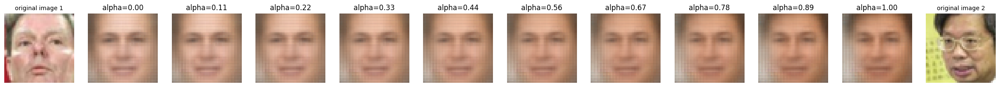

In [ ]:
# 6
sample_index = random.sample(range(1, len(data)), 2)
morphBetweenImages(data[sample_index[0]], data[sample_index[1]], 10)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


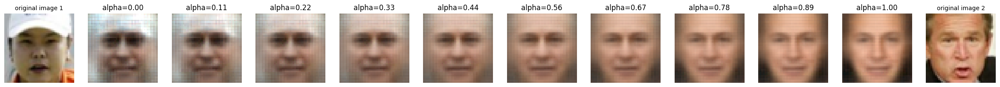

In [ ]:
# 7
sample_index = random.sample(range(1, len(data)), 2)
morphBetweenImages(data[sample_index[0]], data[sample_index[1]], 10)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step


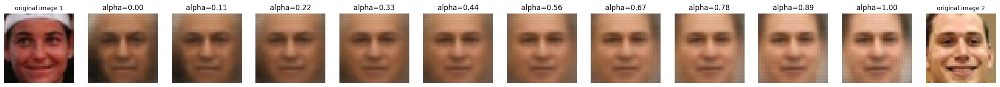

In [ ]:
# 8
sample_index = random.sample(range(1, len(data)), 2)
morphBetweenImages(data[sample_index[0]], data[sample_index[1]], 10)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


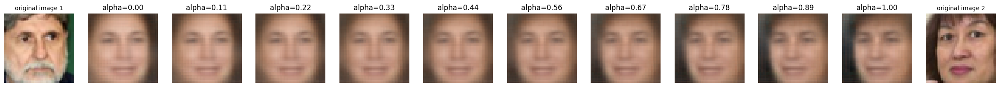

In [ ]:
# 9
sample_index = random.sample(range(1, len(data)), 2)
morphBetweenImages(data[sample_index[0]], data[sample_index[1]], 10)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


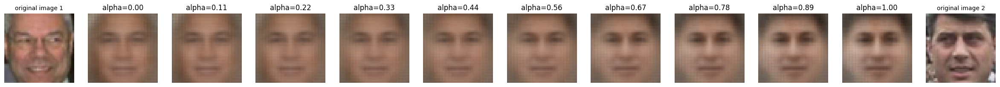

In [ ]:
# 10
sample_index = random.sample(range(1, len(data)), 2)
morphBetweenImages(data[sample_index[0]], data[sample_index[1]], 10)

* **Briefly explain how the morphing works**

The morphBetweenImages function performs latent space interpolation to morph between two face images. First, it encodes both images. The encoder maps both input images (img1 and img2) into the latent space, producing latent vectors z1 and z2. Each latent vector is a compressed 100-dimensional representation of the face. Then it does linear interpolation. The function creates intermediate latent vectors by computing a weighted combination: z = (1-alpha) z1 + (alpha)z2, where alpha ranges from 0 to 1. When alpha=0, we get z1 (original image 1), and when alpha=1, we get z2 (original image 2). Values in between create a smooth transition. Finally, it decodes intermediate representations. Each interpolated latent vector z is fed through the decoder, which generates a face image. This produces a sequence of faces that gradually transition from image 1 to image 2.

One important insight is that by interpolating in the latent space rather than pixel space, we get meaningful transitions, i.e. facial features smoothly blend rather than seeing both faces at the same time or seeing wierd glitches and distortions.

* **Do the generated faces look like what you expected?**

Yes, for the most part. Overall the morphed faces show smooth, gradual transitions between the two original images. The intermediate faces look realistic despite being slightly blurry or having minor distortions, which demonstrates that the VAE learned a good latent representation where interpolation produces valid face images.

* **Does any of the pairs work better than the others? If so, what kind of image pairs work better?**

The morphing quality varies depending on the similarity of the starting faces. Better morphs occur when the two faces share similar attributes (same pose, similar lighting, same gender, similar age). In these cases, the transition is very smooth with intermediate steps looking more or less natural and realistic.
This can be seen for example in morphs 1, 3, 4 and 10.

More challenging morphs occur when faces differ dramatically (e.g., different genders, very different ages, different poses or lighting conditions). These morphs still work but may show more abrupt changes in certain features or slight artifacts during the transition. This can be seen in morphs 2, 6 and 7.

It's interesting to note that some pairs have smooth transitions despite having completely different facial attributes or genders, like in morph 5 (or even 9 slightly).

In general however, the best image pairs are those that are already "close" in the latent space, i.e they share many common attributes and only differ in a few dimensions.


### 1.5 Attribute shift (10 points)

In 1.3, we've seen that faces with the same attributes form clusters in the latent space. In this problem, you will implement a function `AttributeShift` to change one attribute of the faces.

First implement the function `AttributeShift`. (5 points)
1. Calculate the latent space codes for two sets of faces that are different in one attribute, e.g. smile vs. no smile.
2. Calculate the mean latent space code for each group.
3. Get the attribute shifting vector by taking the difference between the two codes.
4. Perform attribute shift by adding the attribute shifting vector to the latent space code of the faces you want to modify.
5. Generate the image using the new latent space codes.

Here is a diagram demonstrating the shift in the latent space. Please note that the two-dimensional latent space is just for demonstration purpose. You should *not* use PCA in this problem. Instead, use the original latent space.
![Diagram_1_5](https://raw.githubusercontent.com/YData123/sds365-sp22/main/assignments/assn3/Diagram_1_5.png)

Perform attribute shift on at three attributes including smile. Comment on the faces with shifted attributes. (5 points)
* Do the generated faces look like what you expected? If not, can you think of some possible reasons?
* Do the faces with new attributes resemble the original faces? If not, can you think of some possible reasons?
* Which of the attribute shift is more successful? What are some possible reasons?
* Comment on any other aspects of your findings that are interesting to you.

In [ ]:
# Don't change this helper function!
def PlotAttributeShift(data2,pic_output):
    sample_index = random.sample(range(1, len(data2)), 16)

    fig, axs = plt.subplots(4, 8)
    fig.set_figheight(10)
    fig.set_figwidth(15)

    for i in range(4):
        for j in range(4):
            axs[i, 2*j].imshow(data2[sample_index[4*i+j], :, :, :])
            axs[i, 2*j].axis('off')
            axs[i, 2*j+1].imshow(np.clip(pic_output[sample_index[4*i+j]],0,1))
            axs[i, 2*j+1].axis('off')

In [ ]:
def AttributeShift(encoder_model, decoder_model, data1, data2):
    """
    Shift attributes of faces by finding the difference vector between two attribute groups
    Parameters:
    - encoder_model: trained encoder model
    - decoder_model: trained decoder model
    - data1: faces with attribute (e.g., smiling faces)
    - data2: faces without attribute (e.g., non-smiling faces)

    Returns:
    - pic_output: array of shifted face images
    """
    # Calculate the latent space codes for both groups
    latent1 = encoder_model.predict(data1)  # Faces with the attribute
    latent2 = encoder_model.predict(data2)  # Faces without the attribute

    # Calculate the mean latent space code for each group
    mean_latent1 = np.mean(latent1, axis=0)  # Mean of group with attribute
    mean_latent2 = np.mean(latent2, axis=0)  # Mean of group without attribute

    # Get the attribute shifting vector (difference between means)
    shift_vector = mean_latent1 - mean_latent2

    # Perform attribute shift by adding the shift vector to data2 latent codes
    # We're adding the attribute to faces that don't have it
    shifted_latent = latent2 + shift_vector

    # Generate images using the new latent space codes
    pic_output = decoder_model.predict(shifted_latent)

    return pic_output

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step 


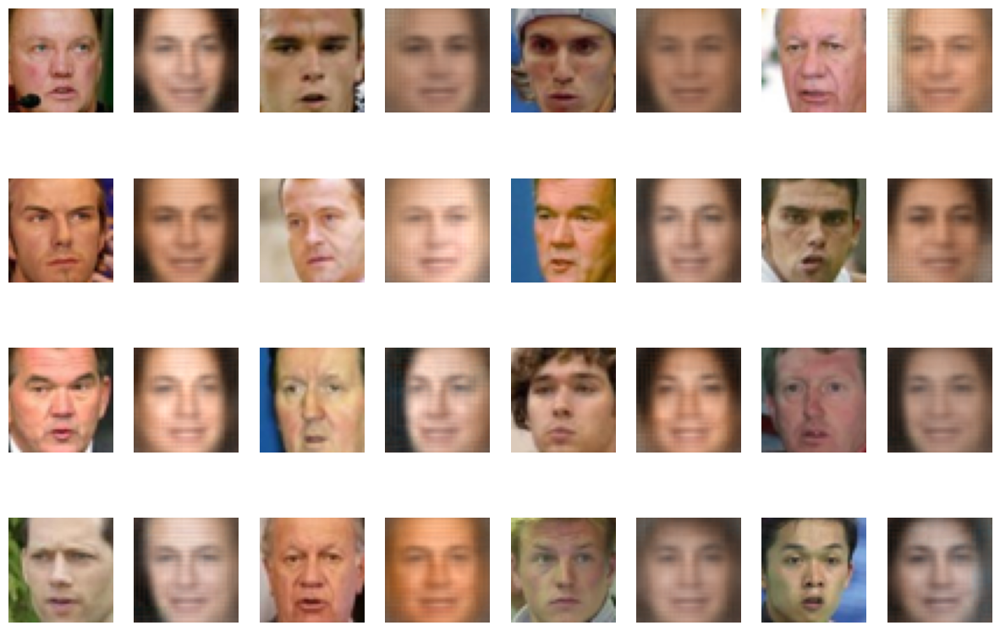

In [ ]:
# Attribute shift 1: smile
pic_output = AttributeShift(encoder_model,decoder_model,smile_data,no_smile_data)
PlotAttributeShift(no_smile_data,pic_output)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


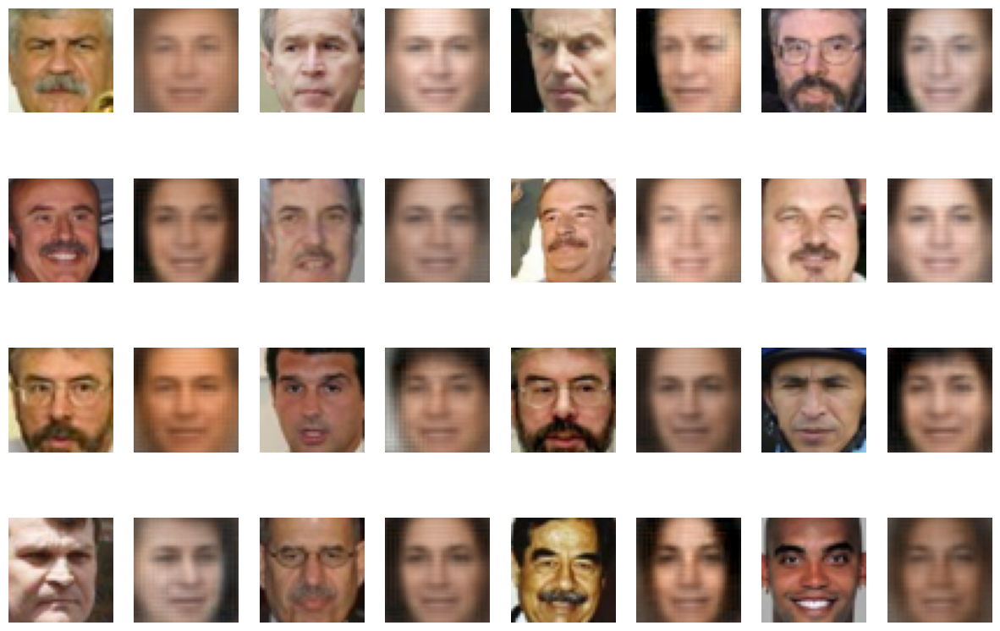

In [ ]:
# Attribute shift 2: male to female shift (adding femininity to male faces)
pic_output2 = AttributeShift(encoder_model, decoder_model, female_data, male_data)
PlotAttributeShift(male_data, pic_output2)

73/73 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step
339/339 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step
339/339 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step


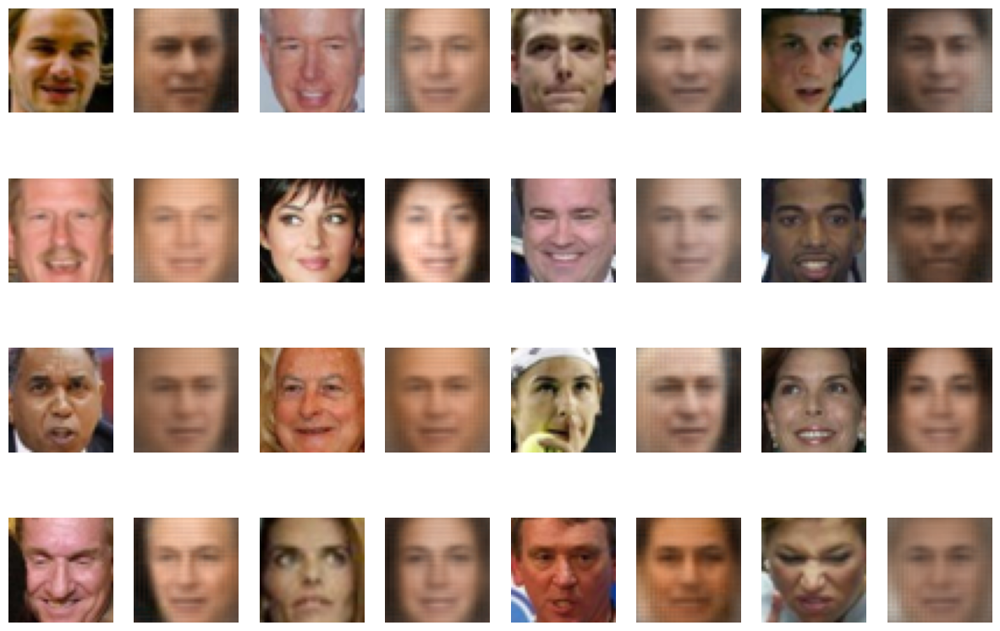

In [ ]:
# Get people with eyeglasses (positive values)
eyeglasses_indices = attrs[attrs['Eyeglasses'] > 0].index
# Get people without eyeglasses (negative values)
no_eyeglasses_indices = attrs[attrs['Eyeglasses'] < 0].index

eyeglasses_data_new = data[eyeglasses_indices]
no_eyeglasses_data = data[no_eyeglasses_indices]

# Attribute shift 3: add eyeglasses to faces without them
pic_output3 = AttributeShift(encoder_model, decoder_model, eyeglasses_data_new, no_eyeglasses_data)
PlotAttributeShift(no_eyeglasses_data, pic_output3)

* **Do the generated faces look like what you expected? If not, can you think of some possible reasons?**

The generated faces are partially successful but not exactly what I expected. For the smile and male-to-female shifts, the results showed small changes in the intended direction; some faces displayed slight modifications in facial expressions or features. However, the eyeglasses shift was very unsuccessful, with literally no visible glasses appearing on the faces.
Possible reasons for this are:
1. Entangled representations. The latent space may encode multiple correlated attributes together rather than isolating individual features. For example, the "smile vector" might include other attributes that tend to co-occur with smiling in the training data.
2. Accessories vs. facial features. Eyeglasses are external objects placed on the face, not intrinsic facial characteristics. The VAE likely struggled to learn how to generate discrete objects as it was trained primarily on continuous facial variations.
3. Limited training examples. If certain attributes like eyeglasses appeared less frequently in the training data, the model may not have learned a strong, distinct direction in latent space for that attribute.

* **Do the faces with new attributes resemble the original faces? If not, can you think of some possible reasons?**

Not really... the shifted faces have lost their individual identity. Rather than preserving the unique characteristics of each original face, the results show what appears to be the same generic "average" face repeated with only minor variations to superficially match the original (like approximate skin tone, hair color, or head pose). The distinct facial features in the original images are mostly gone though.
Some possible reasons could be:
1. Regression to the mean: when we add the shift vector to each face's latent code, we're essentially moving all faces toward a common "average face + attribute" representation. The shift vector itself encodes an average difference across many faces, so applying it pushes individual faces toward this average.
2. Overwriting individual features: the shift vector may be strong enough that it dominates the original latent code, replacing unique individual characteristics with the average pattern of "what a face with this attribute typically looks like."
3. Decoder limitations: the decoder may have learned to generate a "safe," average face when presented with latent codes that combine individual characteristics with averaged shift vectors. Instead of preserving uniqueness while adding the attribute, it defaults to a generic template.
4. Loss of fine-grained details: the latent space compression (to 100 dimensions) may not preserve enough information about individual identity. When we modify the latent code, the subtle details that distinguish one person from another get lost, leaving only broad features like approximate coloring and pose.

* **Which of the attribute shift is more successful?**

The smile shift was most successful. We can see changes around the mouth area and some facial expressions despite it still producing fairly generic-looking results. The male-to-female shift was moderately successful because it displayed some feminisation but again with very generic faces. The eyeglasses shift was a complete failure, with no visible glasses appearing on any faces.

* **What are some possible reasons?**

The smile worked best because it involves localised but continuous changes like mouth curvature and cheek position that VAEs can represent smoothly. It's also a common variation in training data, so the model learned a strong "smile direction" in latent space. Gender was less successful because it affects the entire face structure, and maybe the nature of gender features makes it harder to preserve individual identity while shifting too. Eyeglasses failed completely because they are discrete external objects, not intrinsic facial features. VAEs struggle with sharp geometric shapes and accessories since they're trained to model smooth facial variations, and simple latent arithmetic can't generate positioned objects like glasses. This was even seen at the very start where the generated images was missing the hand covering the mouth for example.

* **Comment on any other aspects of your findings that are interesting to you.**

Probably the "generic face" phenomenon stands out to me yet again. All shifted faces converge toward the same template with only superficial variations. It seems like we're just producing "average face + attribute" kind of images. This suggests the VAE hasn't learned independent representations. The difference between continuous features like smile and discrete objects like glasses also highlights a limitation of VAEs in generating accessories vs modeling facial variations.

### 1.6 Generating new faces (3 points)

Variational autoencoders can be used to generate new data; this is why they are generative models. We can sample new data points from the distribution in latent space and reconstruct new, fake faces based on them.

To draw a sample close to an existing sample in the latent space, we can add a scaled random sample from the normal distribution to the latent space code of an existing sample. The scalar, which we call the `noise_level` is a parameter that we can tune.

Run `GenerateFaces` with three different values of `noise_level` and comment on the generated faces. (3 points)
* Do the generated images look like faces?
* What happens when the new samples diverge more from the existing samples? What is a possible reason?

In [ ]:
def GenerateFaces(data, LATENT_SPACE_SIZE, noise_level):
    sample_index = random.sample(range(1, len(data)), 15)
    latent_space = noise_level*np.random.normal(size=(15,LATENT_SPACE_SIZE))+encoder_model.predict(data[sample_index])
    generated_image = decoder_model.predict(latent_space)
    fig = plt.figure(figsize=(15,10))

    number_of_images = 15  # define nb of faces wanted

    for i in range(number_of_images):
        ax = fig.add_subplot(3, 5, i+1)
        ax.imshow(np.clip(generated_image[i, :,:,:],0,1))
        ax.axis('off')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step


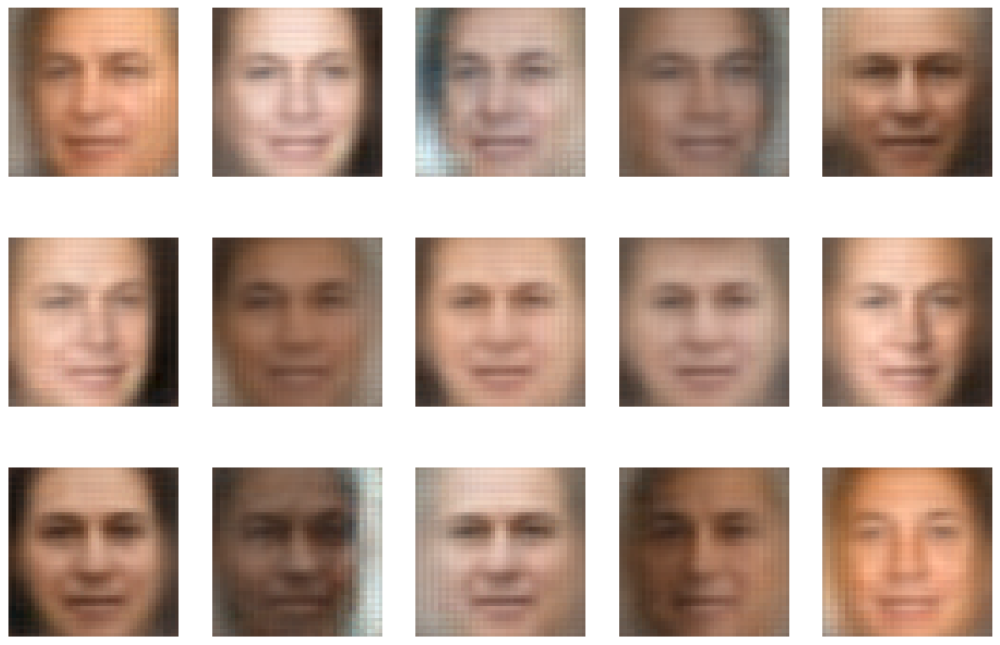

In [ ]:
GenerateFaces(data,LATENT_SPACE_SIZE,0.1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


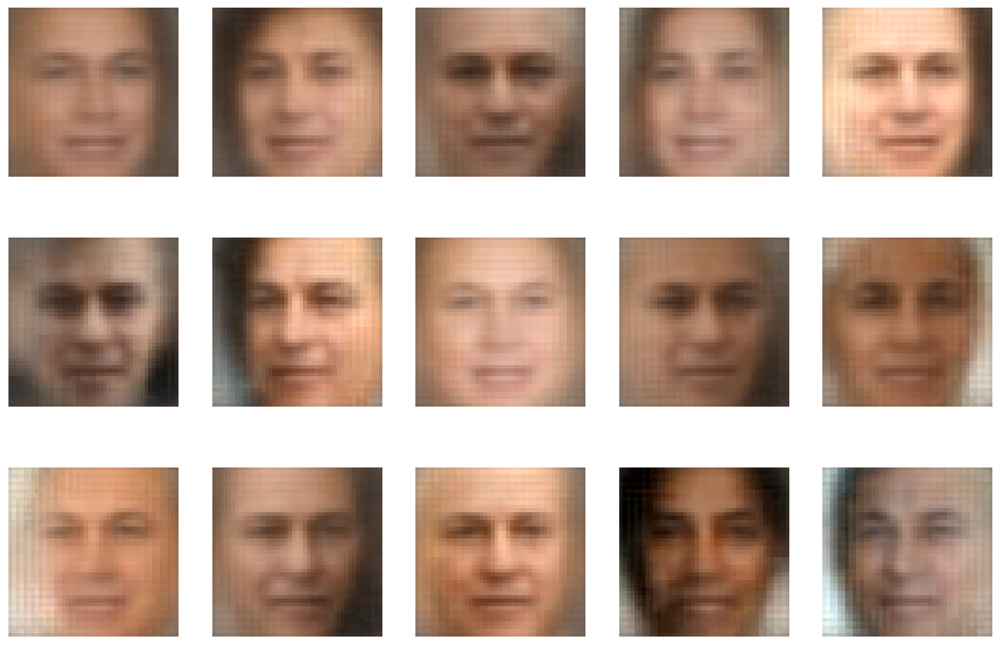

In [ ]:
GenerateFaces(data,LATENT_SPACE_SIZE,0.5)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


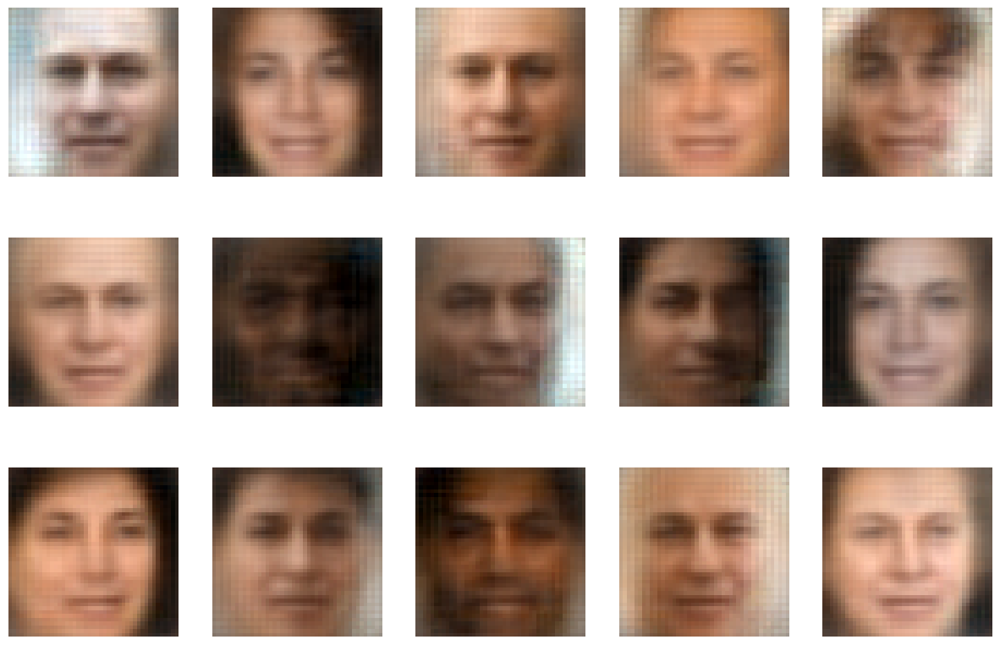

In [ ]:
GenerateFaces(data,LATENT_SPACE_SIZE,1)

* **Do the generated images look like faces?**

Yes all generated images clearly look like faces across all three noise levels. Even at the highest noise level, the basic facial structure with eyes, nose, eyebrows, and mouth is preserved. However, the quality and how realistic they look vary. We can notice that lower noise produces more realistic, training-data-like faces (the same generic face we have been talking about), whereas higher noise creates more diverse but lower-quality faces (specifically we can see different skin tones and hair types).

* **What happens when the new samples diverge more from the existing samples? What is a possible reason?**

The quality doesn't drastically change across the three noise levels. All generated faces remain somewhat blurry regardless of noise level, though lower noise produces slightly sharper images. The main difference is that higher noise levels create more diversity in the generated faces, but this diversity isn't necessarily positive because where we have high noise, the model generates faces with features that seem inconsistent with the original samples. For example, predicting dark skin tones when starting from light-skinned faces, or generating feminine features when the original face is masculine. Interestingly though, at higher noise levels, we see less of the "generic face" phenomenon.

The possible reason is that low noise keeps the latent codes close to the original samples, so the decoder produces safe faces. High noise pushes the latent codes further away, forcing the decoder to explore more varied regions of the latent space. This creates more diversity but since these regions are less well-represented in the training data, the decoder makes inconsistent predictions about attributes like skin tone and gender presentation. Essentially, more noise means more exploration but less control over what attributes actually get generated.

### Optional: Changing the loss function (2 points extra credit)

The variable `factor` is a parameter of the loss function. In this optional problem, you will play with it and think about its effect on the performance of VAE.

Retrain the model with a smaller factor. Repeat 1.2, 1.6 (using `noise_level` = 1) and latent space visualization. Comment on how the reconstruction results, generated new faces and latent space distributions change. (2 points)
* Which model reconstructs the faces better?
* Do the generated faces look different?
* How do the latent variable distributions differ?
* Do the differences make sense? Can you explain what you observed?

In [ ]:
# Data was taking way too long to load :(

[Your markdown here]

## Problem 2: Gaussian neighborhood regression (10 points)
In multivariate Gaussians, edges are about *direct* relationships after controlling for all other variables. The conditional law of a single coordinate $X_i$ given the rest $X_{-i}$ reveals which variables directly “enter” the model for $X_i$. Algebraically, this local behavior is encoded by the $i$th row/column of the precision matrix $\Omega=\Sigma^{-1}$.  Graphical Lasso estimates a sparse precision matrix $\widehat{\Omega}$ by maximizing the Gaussian log-likelihood with an $\ell_1$ penalty on off-diagonal entries. Zeros in $\widehat{\Omega}$ correspond to missing edges (conditional independences) in the learned graph.



Let $X=(X_1,\dots,X_p)^\top \sim \mathcal N_p(0,\Sigma)$, and write $\Omega=\Sigma^{-1}$. For $i\in\{1,\dots,p\}$, denote $-i=\{1,\dots,p\}\setminus\{i\}$.




### 2.1 Conditional law of one node.
Show that $X_i\mid X_{-i}$ is Gaussian with a linear mean in $X_{-i}$. Express the regression coefficients $\beta_{i\leftarrow -i}\in\mathbb{R}^{p-1}$ and the conditional variance $\sigma^2_{i\mid -i}$ in terms of $\Omega$.


*Hint.* You may *complete the square* on $x^\top\Omega x$, or use a *Schur complement* derivation. After permuting coordinates so that $i$ is first, partition
$$
\Sigma \;=\; \begin{bmatrix}
a & b^\top \\[4pt]
b & C
\end{bmatrix},
\quad
a=\Sigma_{ii}\in\mathbb{R},\; b=\Sigma_{-i,i}\in\mathbb{R}^{p-1},\; C=\Sigma_{-i,-i}\in\mathbb{R}^{(p-1)\times(p-1)}.
$$
**Schur complement.** If $C$ is invertible (it is, since $\Sigma\succ 0$), the Schur complement of $C$ in $\Sigma$ is
$$
S \;:=\; a - b^\top C^{-1} b .
$$
**Block inversion formula.** Then
$$
\Sigma^{-1}
=\begin{bmatrix}
S^{-1} & -\,S^{-1} b^\top C^{-1}\\[4pt]
-\,C^{-1} b S^{-1} & C^{-1} + C^{-1} b S^{-1} b^\top C^{-1}
\end{bmatrix}.
$$

**Please refer to the appendix attached at the end of the pdf**


### 2.2 One neighbor at a time.
Fix $j\neq i$. First prove that the coefficient of $X_j$ in the mean of $X_i \mid X_{-i}$ equals zero if and only if $\Omega_{ij}=0$. Then deduce (Gaussian case) that
$$\Omega_{ij}=0 \quad\Longleftrightarrow\quad X_i\ \perp\ X_j\ \big|\ X_{-(i,j)}.$$


*Hint:* Use the result from 2.1. *“iff” ($\Longleftrightarrow$) means:* prove **both** directions (⇒ and ⇐).  


**Please refer to the appendix attached at the end of the pdf**


### 2.3 Factorization and graph structure
Suppose every coefficient in the mean of $X_i\mid X_{-i}$ is zero (i.e., $\beta_{i\leftarrow -i}=0$). Show that the joint density factorizes as $p(x)=p(x_i)\,p(x_{-i})$. Briefly interpret the implication **for the graph structure**.

**Please refer to the appendix attached at the end of the pdf**


## Problem 3: Taking stock (15 points)

A joint distribution of data has a natural graph associated with it. When the distribution is multivariate normal, this graph is encoded in the pattern of zeros and non-zeros in the inverse of the covariance matrix, also known as the "precision matrix."

In class we demonstrated the graphical lasso for estimating the graph on ETF data.
In this problem you will construct two different "portfolios" of stocks,
and run the graphical lasso to estimate a graph, commenting on your results.

All of the code you might need for this is contained in the demo.


## Data provided

As demonstrated in class, you will run on equities data downloaded from Yahoo Finance. Your job is to construct two “portfolios” of stocks, each with some organizing principle (e.g., sectors, regions, indices vs. equities). Each portfolio must contain **at least 20 stocks**. The page https://en.wikipedia.org/wiki/List_of_S%26P_500_companies has GICS sectors, which you may find useful for the glasso problem.


You are provided two CSV files containing stock prices **since 2021-09-10 (post-COVID start)**:
- [full_stock_daily.csv](https://raw.githubusercontent.com/YData123/sds365-fa25/main/assignments/assn3/full_stock_daily.csv) (rows = dates, columns = **ticker** symbols; daily close)
- [full_stock_weekly.csv](https://raw.githubusercontent.com/YData123/sds365-fa25/main/assignments/assn3/full_stock_weekly.csv) (rows = dates, columns = **ticker** symbols; weekly close = last available trading day of the week)

> **Note on NAs.** Some symbols begin trading after 2021-09-10, so their early entries will be `NA`. Handle missingness during preprocessing (see checklist below).  

> You can look up prices by ticker and date directly from these CSVs. If a needed symbol is **not** in the CSVs, use the provided **R file** `stock_price_from_yahoo_finance.r` to fetch it (via BatchGetSymbols) and merge it into your working data.

**Preprocessing checklist (concise):**
- Select your symbols; **align dates** across symbols.
- For the analysis window you choose, **filter** symbols with poor coverage (e.g., keep ≥90–95% non-missing).
- Build a **complete-cases** matrix for Graphical Lasso (no NAs across chosen symbols/dates).

### Analyzing  your portfolios

Your task is to analyze each porfolio using the graphical lasso, and comment on your findings.
Here are the types of questions you should address:

* How did you choose the portolio? How did you choose the date range and frequency (daily, weekly, etc.)? Remember, each of the portfolios must contain at least 20 stocks, and be organized in some reasonable way.

* Display the graph obtained with the graphical lasso, using networkx. How did you choose the regularization level? Does the structure of the graph make sense? Is it sensitive to the choice of regularization level? Is this the structure you expected to see when you designed the portfolio? Why or why not?

* What are some of the conditional independence assumptions implied by the graph? Are some parts of the graph more densely connected than others? Why?




In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
# imports and helpers
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.covariance import GraphicalLassoCV
from sklearn.preprocessing import StandardScaler
from pathlib import Path

CSV_PATH = Path("/content/drive/MyDrive")
WEEKLY_CSV = CSV_PATH / "full_stock_weekly.csv" # chose "weekly" assuming (pretending) I am a long-term investor (this is good for buy-and-hold or swing investors)
START = "2021-09-10"
END = None

# my portfolios; for this problem I'm going to choose financials for the first and healthcare for the second

# S&P 500 financials (banks, insurers, asset managers, credit-rating agencies)
# These include JPMorgan, Bank of America, Wells Fargo and co, Citigroup inc, Goldman Sachs, Morgan Stanley, Black Rock...
financials = ["JPM","BAC","WFC","C","GS","MS","BLK","SCHW","CME","AXP",
              "USB","PNC","TFC","SPGI","MCO","BK","STT","ICE","CB","TRV",
              "ALL","PGR","MMC","AJG","MET","PRU","AIG"]

# S&P 500 healthcare (pharma, biotech, equipment, managed-care providers)
# These include Johnson and Johnson, United Health group, Eli Lilly and co, Merck, Abbvie inc...
healthcare = ["JNJ","UNH","LLY","MRK","ABBV","PFE","DHR","TMO","ABT","BMY",
              "AMGN","GILD","REGN","VRTX","ISRG","BIIB","DXCM","IDXX","MDT",
              "SYK","HUM","CI","HCA","MCK","ZBH","ILMN","RMD"]

def load_subset(tickers):
    df = pd.read_csv(WEEKLY_CSV, parse_dates=[0])
    df = df.rename(columns={df.columns[0]: "date"}).set_index("date").sort_index()
    if START: df = df[df.index >= pd.to_datetime(START)]
    if END:   df = df[df.index <= pd.to_datetime(END)]
    df = df[[t for t in tickers if t in df.columns]].copy()
    # simple fill, then drop any remaining NAs
    df = df.ffill().bfill().dropna(how="any")
    return df

# glasso
def glasso_from_prices(prices):
    # log returns: log(1 + pct_change)
    r = np.log1p(prices.pct_change()).iloc[1:]
    X = StandardScaler().fit_transform(r.values)
    model = GraphicalLassoCV().fit(X)
    return r, model

prices_fin  = load_subset(financials)
prices_hlth = load_subset(healthcare)

ret_fin,  model_fin  = glasso_from_prices(prices_fin)
ret_hlth, model_hlth = glasso_from_prices(prices_hlth)

print(f"Financials: {ret_fin.shape[0]} obs × {ret_fin.shape[1]} stocks | alpha={model_fin.alpha_:.3g}")
print(f"Healthcare: {ret_hlth.shape[0]} obs × {ret_hlth.shape[1]} stocks | alpha={model_hlth.alpha_:.3g}")

def graph_from_precision(cols, precision, thresh=1e-2):
    P = precision.copy()
    np.fill_diagonal(P, 0.0)
    var1, var2, val = [], [], []
    for i in range(len(cols)):
        for j in range(i+1, len(cols)):
            if abs(P[i, j]) > thresh:
                var1.append(cols[i]); var2.append(cols[j]); val.append(P[i, j])
    links = pd.DataFrame({"var1": var1, "var2": var2, "value": val})
    G = nx.from_pandas_edgelist(links, "var1", "var2", edge_attr="value")
    return G

def draw(G, title):
    pos = nx.spring_layout(G, seed=42, k=1.7/np.sqrt(max(1,len(G.nodes()))), iterations=20)
    plt.figure(figsize=(9,7))
    nx.draw(G, pos=pos, node_size=600, with_labels=True, font_size=9)
    plt.title(title); plt.axis("off"); plt.show()

/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:185: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


Financials: 206 obs × 27 stocks | alpha=0.196
Healthcare: 206 obs × 27 stocks | alpha=0.184


/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:185: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)


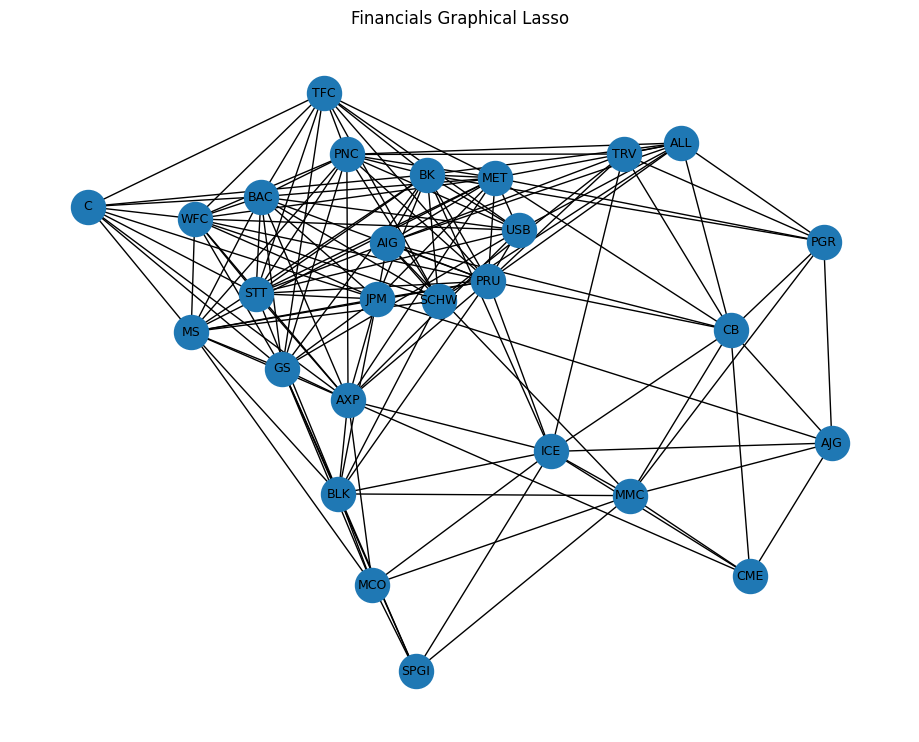

In [ ]:
G_fin  = graph_from_precision(ret_fin.columns,  model_fin.precision_,  thresh=1e-2)
draw(G_fin,  "Financials Graphical Lasso")

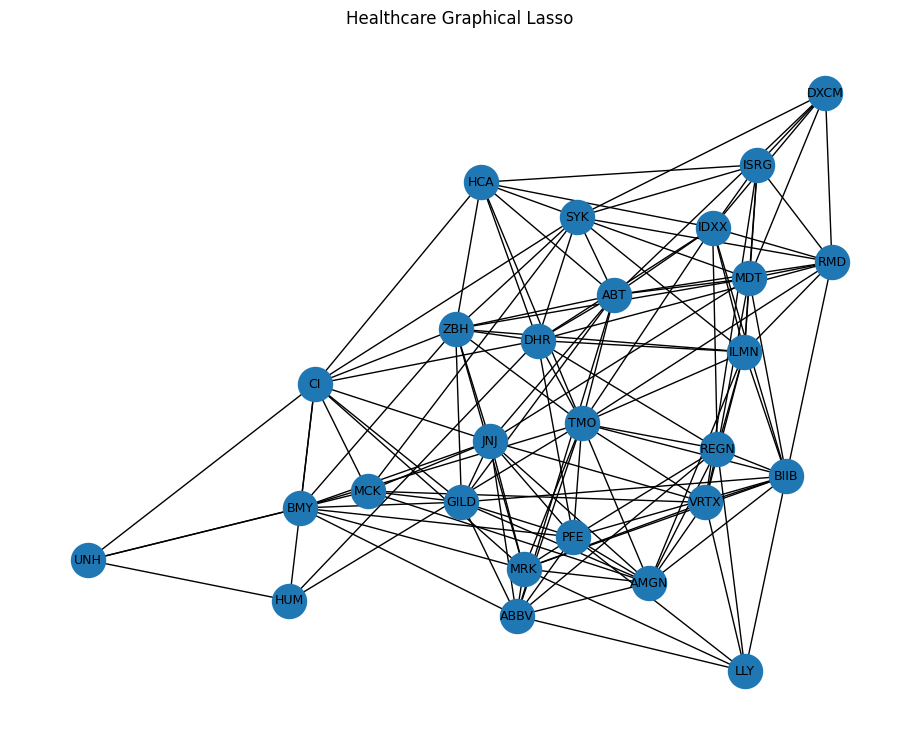

In [ ]:
G_hlth = graph_from_precision(ret_hlth.columns, model_hlth.precision_, thresh=1e-2)
draw(G_hlth, "Healthcare Graphical Lasso")

In [ ]:
# this is to answer the question on whether the graph is sensitive to the choice of regularization level
# define a sensitivity function
def sensitivity_from_returns(ret, base_alpha, label, multipliers=(0.8, 1.0, 1.2), thresh=1e-2):
    """
    Refit Graphical Lasso at alpha * multiplier values and draw the graphs
    ret:  pandas DataFrame of log-returns (already aligned)
    base_alpha: float (e.g., model_fin.alpha_)
    label: title prefix
    multipliers: iterable of scale factors
    thresh: edge threshold on |precision_ij|
    """
    X = StandardScaler().fit_transform(ret.values)
    for m in multipliers:
        a = base_alpha * m
        model = GraphicalLasso(alpha=a).fit(X)
        G = graph_from_precision(ret.columns, model.precision_, thresh=thresh)
        draw(G, f"{label} - alpha={a:.3g} (x{m:.1f})")

def graph_stats(G):
    n = G.number_of_nodes()
    m = G.number_of_edges()
    possible = n * (n - 1) // 2
    dens = m / possible if possible else 0.0
    return {"nodes": n, "edges": m, "density": round(dens, 3)}

Base alpha (Financials) = 0.1961


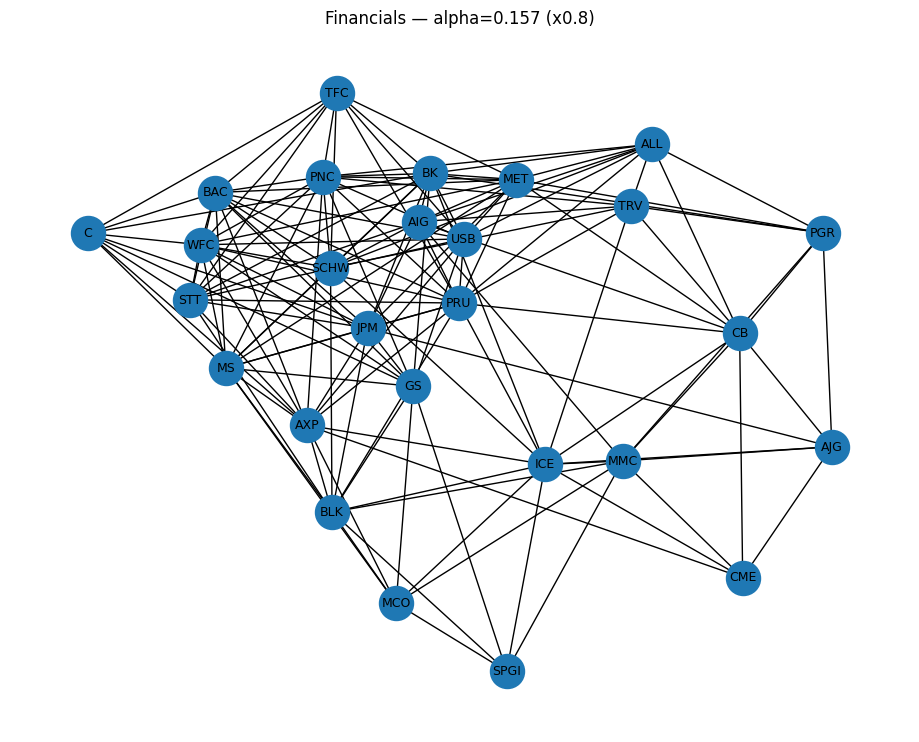

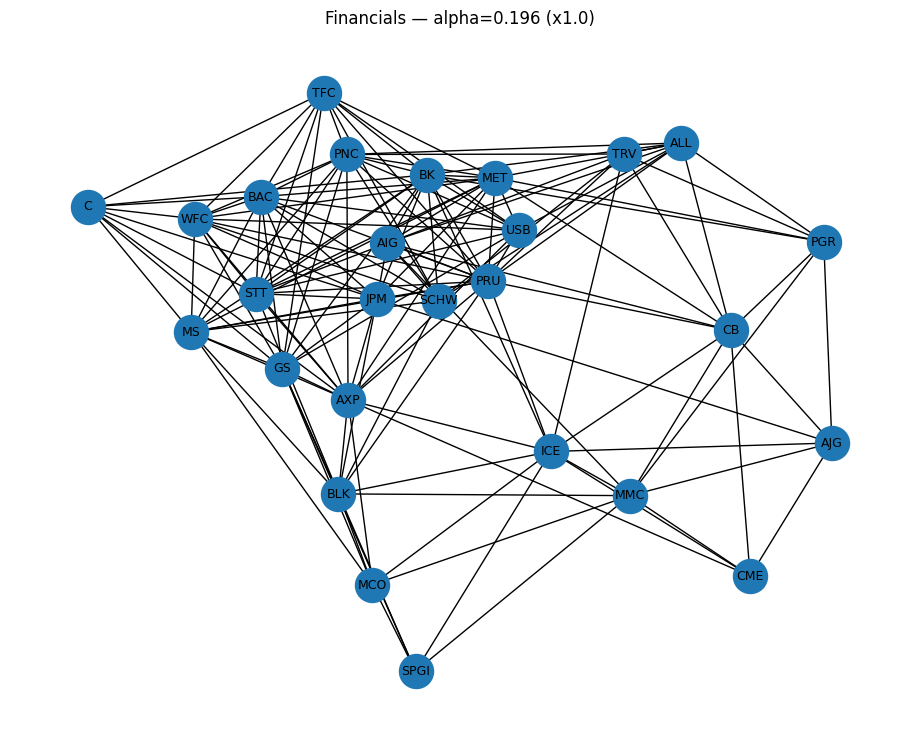

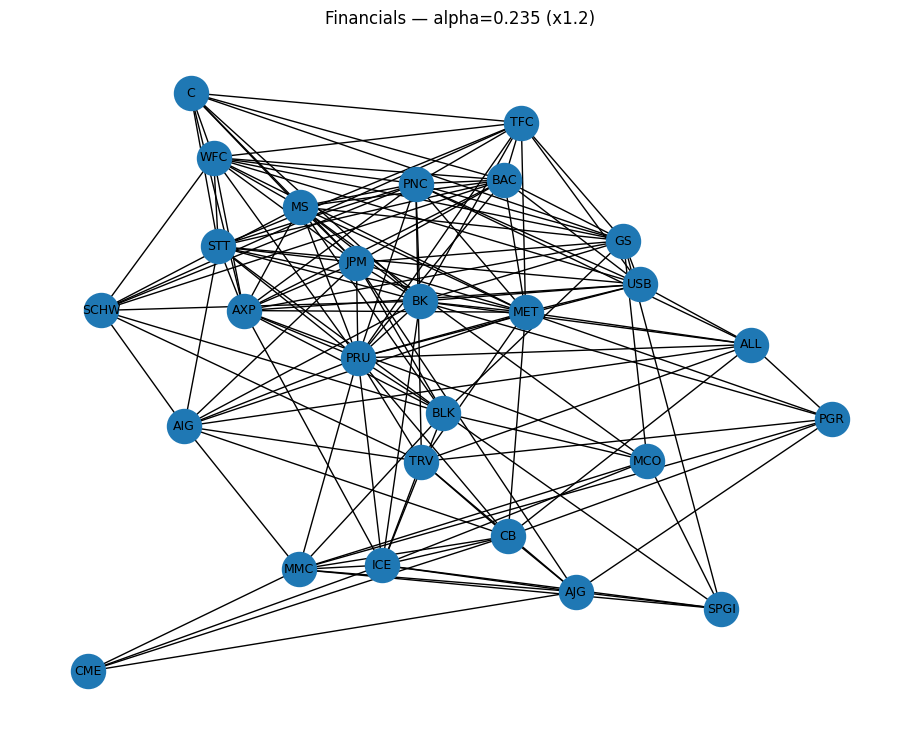

In [ ]:
print(f"Base alpha (Financials) = {model_fin.alpha_:.4g}")
sensitivity_from_returns(ret_fin, model_fin.alpha_, "Financials", multipliers=(0.8, 1.0, 1.2), thresh=1e-2)

Base alpha (Healthcare) = 0.1837


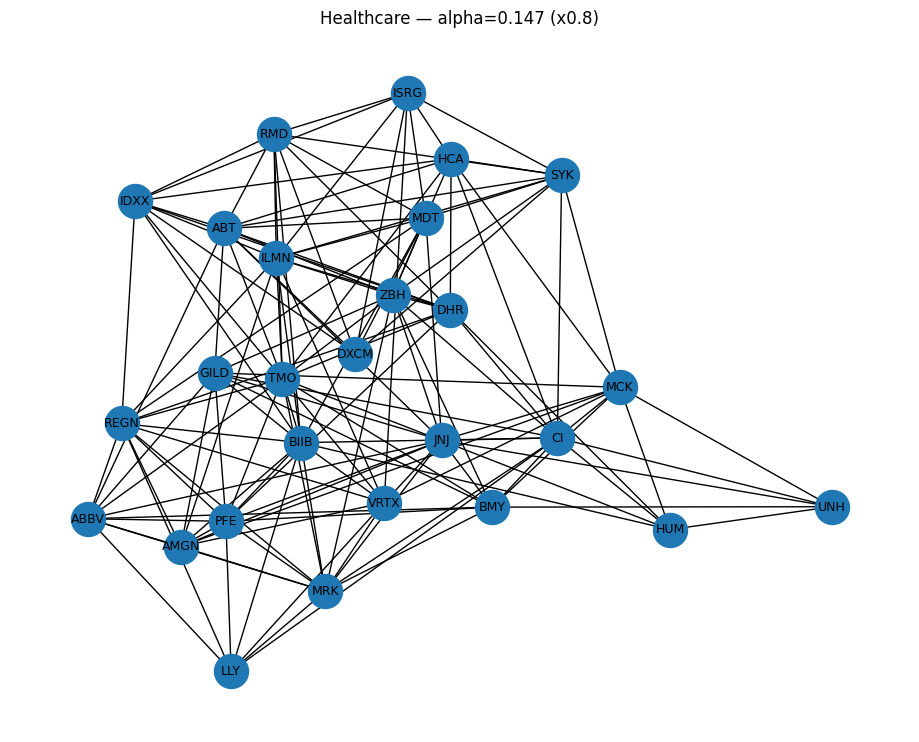

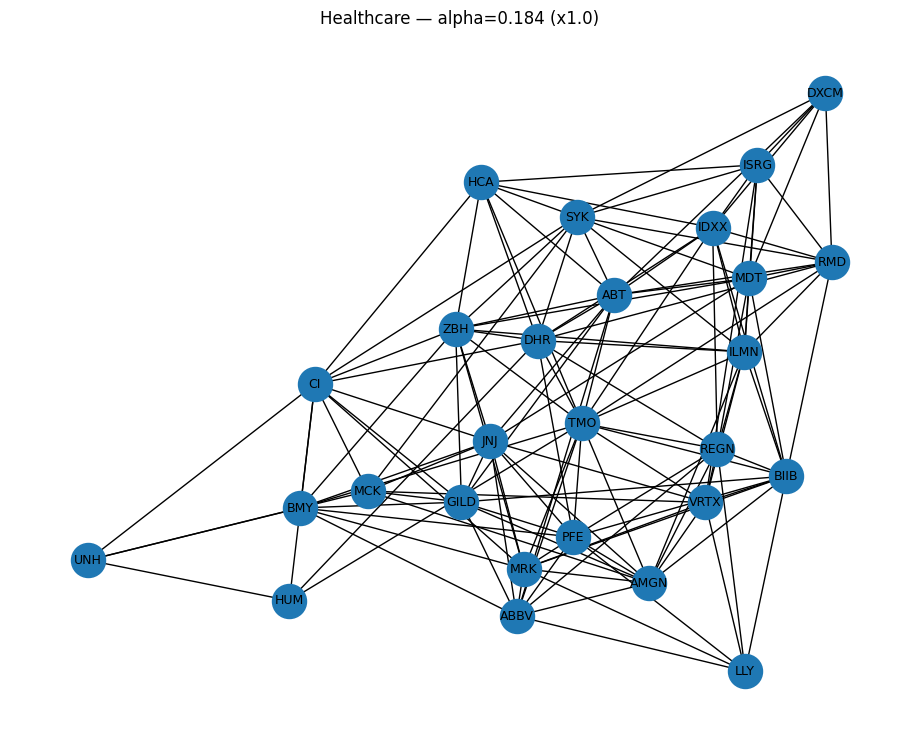

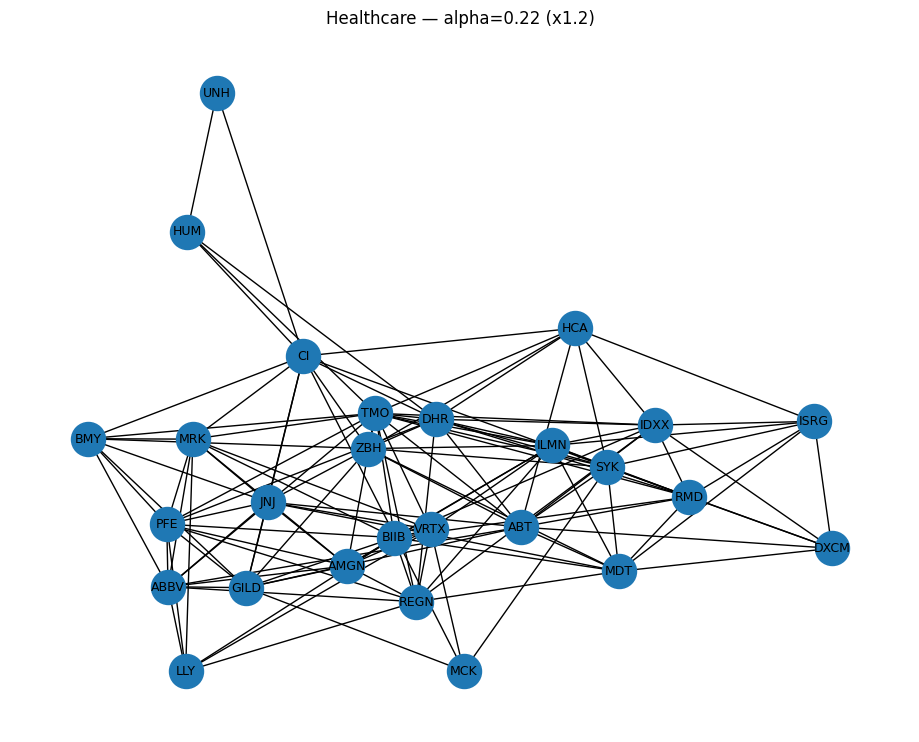

In [ ]:
print(f"Base alpha (Healthcare) = {model_hlth.alpha_:.4g}")
sensitivity_from_returns(ret_hlth, model_hlth.alpha_, "Healthcare", multipliers=[0.8, 1.0, 1.2], thresh=1e-2)

# Discussion

I constructed two portfolios with 27 stocks each to test how the graphical lasso reveals conditional dependencies within sectors. The first portfolio contains financial stocks including major banks like JPM and BAC, regional banks like PNC and TFC, insurers like AIG and CB, asset managers like BLK and SCHW, exchanges like CME and ICE, and credit rating agencies like SPGI and MCO. I chose financials because they share fundamental drivers like interest rates, credit cycles, and regulatory environments. For example, when the Federal Reserve changes rates, all banks see margin impacts. This shared sensitivity should create dense conditional dependencies even after controlling for broad market factors.

The second portfolio contains healthcare stocks spanning pharma companies like JNJ and PFE, biotech firms like AMGN and VRTX, medical device makers like MDT and ISRG, lab equipment companies like TMO and DHR, health insurers like UNH and HUM, and hospital operator HCA. Healthcare seemed more diverse since a surgical robot company operates very differently from a drug manufacturer or health insurer. However, all face common healthcare policy pressures like drug pricing legislation, Medicare reimbursement rates, and FDA approval processes. I expected healthcare to show clearer sub-sector clustering with fewer cross-sector connections compared to the more homogeneous financial sector.

## Data and Methods

I used weekly stock prices from September 10, 2021 through October 2025, giving about 206 observations. This start date represents the post-COVID recovery period (as was specified in the assignment). I chose weekly rather than daily frequency because I'm thinking like a long-term investor where weekly returns capture more meaningful correlations. I'm assuming daily data has too much random fluctuation that doesn't reflect the fundamental relationships I am trying to look at.

Following the demo approach, I forward-filled small gaps to handle missing trading days, removed any remaining rows with missing values to ensure a complete-cases matrix, calculated log-returns using np.log1p, and standardized all returns to mean zero and unit variance. The standardization is critical because the graphical lasso's L1 penalty must apply equally to all variables. Without it, stocks with higher natural volatility would be penalized more, biasing the graph structure.

I used GraphicalLassoCV which automatically selects the regularization parameter alpha through cross-validation. The algorithm splits the data into folds, fits models with different alpha values, evaluates held-out log-likelihood on validation folds, and picks the alpha that maximizes validation performance. This approach avoids arbitrary choices and balances model fit against sparsity. After fitting, I kept only edges where the absolute precision value exceeded 0.01 (following the demo) and visualized the graphs using networkx with spring layout. For sensitivity analysis, I re-estimated each portfolio at alpha times 0.8, 1.0, and 1.2 to test whether the structure is robust or sensitive to regularization choices.

## Results and Graph Structure

Cross-validation selected alpha = 0.196 for financials and 0.184 for healthcare, both very similar values, suggesting comparable correlation structures in the data. Both portfolios produced dense graphs at these optimal regularization levels.

The financial graph shows nearly every stock connected to multiple others. Central hubs include TFC, PNC, BAC, and AIG which connect to almost every other node. The major banks form a tightly connected core, remaining conditionally dependent even after controlling for market-wide effects. This likely reflects direct relationships where banks trade with each other in interbank markets, compete for the same commercial clients, and face identical regulatory capital requirements. Insurance companies cluster together but also connect extensively to banks, which makes sense since insurers invest premiums in bonds and loans, creating shared interest rate exposure. The exchanges and rating agencies connect to the main cluster, and almost no stocks are isolated. The density implies that holding multiple financial stocks provides much less diversification than simple correlation analysis would suggest.

The healthcare graph is also very dense, which was a little more surprising. Central hubs include HCA, TMO, DHR, SYK, and DXCM. Pharma and biotech companies cluster together since they face similar FDA timelines, drug pricing pressures, and patent risks. Device companies also show strong interconnections due to common regulatory hurdles and Medicare reimbursement challenges. However, there are many cross-cluster edges connecting seemingly different businesses. For example, HCA connects to device makers because hospitals are major customers, and insurers connect to pharma companies through formulary negotiations and specialty drug cost pressures. The insurers UNH and HUM appear somewhat isolated but are still important connections.

## Sensitivity analysis and interpretation

When I reduced regularization to alpha times 0.8, healthcare became much denser with many additional edges while financials barely changed. At higher regularization of alpha times 1.2, financials stayed relatively dense but healthcare became quite sparse with clear pharma, device, and biotech sub-clusters emerging and insurers isolating from the network. This shows healthcare is pretty sensitive to regularization while financials remain robustly dense across all levels. This confirms that financials are fundamentally more homogeneous while healthcare has distinct business segments that policy links together.

The financial results mostly matched my expectations. I predicted a very dense graph due to shared interest rate exposure and regulatory environment, and that's what appeared. Healthcare did not match expectations too much. I expected much clearer sub-sector clustering with sparse connections. This suggests healthcare policy creates more sector-wide correlation than I anticipated.

Also, with 206 observations for 27 stocks, the graphical lasso may struggle to fully separate sector effects from conditional dependencies, and some observed density might reflect unmodeled market factors rather than true direct relationships.

## Investment implications and limitations

The dense graphs demonstrate that diversification within one sector provides limited protection. If you own ten financial stocks or ten healthcare stocks, they will largely move together during sector shocks because of the heavy conditional dependencies. This suggests sector ETFs may be nearly as effective as careful stock selection within sectors, since sector allocation matters more than individual stock picking. True diversification requires holding assets from multiple sectors with different drivers.

Some important limitations apply. The graphical lasso assumes multivariate Gaussian returns, but stock returns have fat tails especially during crashes. The analysis assumes stationary correlations over 2021-2025, but correlations likely varied. The sample size of 206 observations for 27 stocks is adequate but more data would improve stability. Results reflect the post-COVID period which may have had unusual dynamics (due to post-crisis adaptations for example). The graphs show associations not relationships, so we can say JPM and BAC move together but we cannot say which influences which. Finally, I only analysed same sector portfolios; a portfolio across multiple sectors would likely show much sparser structure (as we saw in class).

## Conclusion

In conclusion, both portfolios show dense conditional dependence structures with most stocks remaining correlated after controlling for all other portfolio members. Despite representing different industries, both show similar density at optimal regularization around alpha equals 0.19. This reveals sector-wide dependencies driven by policy and regulatory factors. Interest rates and banking regulation drive financial dependencies while drug pricing, Medicare policy, and FDA regulation drive healthcare dependencies. The sensitivity analysis confirms these findings are robust, not artifacts of regularization choices. Healthcare shows more structural sensitivity, while financials remain uniformly dense indicating more homogeneity. The main takeaway from an investor point of view is that true diversification requires investing in multiple sectors.